#### **IMPORTAR BIBLIOTECAS**

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from collections import Counter


#### **RECONHECIMENTO DA GPU**

In [2]:
from tensorflow.python.client import device_lib

# Lista dispositivos detalhados
devices = device_lib.list_local_devices()

for device in devices:
    if device.device_type == 'GPU':
        print(f"Nome detalhado da GPU: {device.physical_device_desc}")


Nome detalhado da GPU: device: 0, name: NVIDIA GeForce RTX 2050, pci bus id: 0000:01:00.0, compute capability: 8.6


#### BASE DE DADOS

##### LEITURA DA BASE

In [3]:
# definir caminhos
pathDataTrain = "./files/csv/01-12"
pathDataTest = "./files/csv/03-11"

# definir bases de dados
dataBases = ["DrDoS_DNS", "DrDoS_LDAP", "DrDoS_MSSQL", "DrDoS_NetBIOS", "DrDoS_NTP", "DrDoS_SNMP", "DrDoS_SSDP", "DrDoS_UDP", "Syn", "TFTP", "UDPLag"]
normalDataBase = "normalData"

dataBaseUsed = normalDataBase

df = pd.read_csv(pathDataTrain + "./" + dataBaseUsed + ".csv")

In [4]:
# remover espaços entre os dados de cada uma das colunas
# columns =  [name.removeprefix(" ").removesuffix("  ") for name in df.columns]

columns = df.columns #voltar as colunas originais

# np.unique(df[columns[87]], return_counts=True)

# função para resgatar o nome das colunas dado uma lista de indexes 
def get_indexes_for_nameColumns(indexes):
    return [columns[index] for index in indexes]

columns[41]

' Fwd Header Length'

###### TRATAMENTO DE DADOS

In [5]:
# Salvar colunas dos segundos
savePoint = df.iloc[:, 8]

In [6]:
# Convertendo microsegundos em minutos
df.iloc[:, 8] =  savePoint # flow duration (duração do fluxo)

In [9]:
# Convertendo inteiro em string
df.iloc[:, 6] = df.iloc[:, 6].astype("string") # protocol

##### GRÁFICOS

In [8]:
# Tipos de tráficos
# plt.hist(x=df[columns[87]])
# df[df[columns[87]]=="DrDoS_DNS"].count(axis=0), df[df[columns[87]]=="BENIGN"].count(axis=0)


In [9]:
# count_unique = np.unique(df[columns[87]], return_counts=True)
# fig, ex = plt.subplots()
# ex.pie(count_unique[1], labels=count_unique[0], autopct="%1.1f%%");

In [10]:
# #  Mostrar ips
# unique_ipSorce = np.unique(df[columns[2]], return_counts=True)

# fig, ex = plt.subplots()
# ex.pie(unique_ipSorce[1], labels=unique_ipSorce[0], autopct="%1.1f%%");


In [11]:
# unique = np.unique(df[columns[3]], return_counts=True)
# sns.countplot(x=df[columns[3]])

##### Funções auxíliares (construir gráficos)

In [11]:
def get_df_unique(df_analyzed, name_column_df_analyzed, names_columns=("Value","Count"), order=1):
    uniqueDf = np.unique(df_analyzed[name_column_df_analyzed], return_counts=True)
    df_unique = pd.DataFrame({names_columns[0]:uniqueDf[0], names_columns[1]:uniqueDf[1]})
    return df_unique.sort_values(by=names_columns[order], ascending=False)

def get_df_unique_alt(df_analyzed, name_column_df_analyzed, names_columns=("Value","Count")):
    uniqueDf = np.unique(df_analyzed[name_column_df_analyzed], return_counts=True)
    df_unique = pd.DataFrame({names_columns[0]:uniqueDf[0], names_columns[1]:uniqueDf[1]})
    return df_unique

def make_graph(type_graph, table, xlabel, ylabel, figsize=(8,6), title="", limit_init=0, limit_final=-1):
    """_summary_

    Args:
        type_graph (int): Gráfico que será montado (0 - hot_map | 1 - bar)
        table (dataTable): Tabela que sera usada como 
        xlabel (str): Nome do label do eixo x
        ylabel (str): Nome do label do eixo y
        figsize (tuple, optional): Tamanho padrão (largura x altura) da imagem do gráfico. Defaults to (8,6).
        title (str, optional): Titulo do gráfico. Defaults to "".
    """
    
    if(limit_final == -1):
        limit_final = len(table)
    
    if(type_graph==0):
        hot_graph(table, xlabel, ylabel, figsize, title)
    elif(type_graph==1):
        bar_graph(table, xlabel, ylabel, figsize, title)
    elif(type_graph==2):
        pie_graph(table[xlabel], table[ylabel], title)
    elif(type_graph==3):
        bar_ddos_nrm_compare_graph(table, xlabel, title, limit_init, limit_final)
    else:
        print("type graph not find")

def pie_graph(labels_p, content, title):
    fig, ax = plt.subplots()
    ax.pie(content, labels=labels_p, autopct='%1.1f%%')
    plt.title(title)

def hot_graph(table, xlabel, ylabel, figsize_param, title):
    plt.figure(figsize=figsize_param)
    sns.heatmap(table, annot=True, cmap='viridis', fmt='d')
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.show()

def bar_graph(table, xlabel, ylabel, figsize, title):
    
    plt.figure(figsize=figsize)
    plt.bar(table[xlabel], table[ylabel], color='skyblue')

    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

    plt.show()

def bar_ddos_nrm_compare_graph(table, column, title, limit_init, limit_final):
    wide_df = table[[column, columns[87]]].groupby([column,columns[87]]).size().reset_index(name="Count")
    wide_df = wide_df.sort_values(by=column, ascending=True)
    wide_df[column] = [str(coluna) for coluna in wide_df[column]] # transformar coluna em string

    if((limit_final > 0 or limit_init >= 0) and limit_final > limit_init):
        wide_df = wide_df.iloc[limit_init:limit_final, :]
    
    fig = px.bar(wide_df, x=column, y="Count", color=columns[87], title=title)
    fig.show()
    
def teste():
    wide_df = df[[columns[3], columns[87]]].groupby([columns[3],columns[87]]).size().reset_index(name="Count")
    wide_df[columns[3]] = [str(coluna) for coluna in wide_df[columns[3]]]

    
    fig = px.bar(wide_df.iloc[0:100, :], x=columns[3], y="Count", color=columns[87], title="teste")
    fig.show()
    
    # print(type(wide_df[columns[3]][0]))


def analytic_data_std(data, column, names_columns, q_rangeCut, typeGraph, invert_labels=False, figSize=(8,6), nameGraph="", ignore_first_elements_range=0):
    df_analytic = get_df_unique(data, column, names_columns, order=1)
    
    if(ignore_first_elements_range > 0):
        df_analytic = df_analytic.iloc[ ignore_first_elements_range:,  : ]
 
    # Dividir a base de dados em ranges
    df_analytic[names_columns[0]] = pd.qcut(df_analytic[names_columns[0]], q=q_rangeCut)
    
    # Agrupar dados
    df_analytic = df_analytic.groupby(names_columns[0])[names_columns[1]].sum().reset_index(name=names_columns[1])
    
    df_analytic[names_columns[0]] = df_analytic[names_columns[0]].astype(str)
    
    # Construir o gráfico
    if(invert_labels):
        make_graph(typeGraph, df_analytic, names_columns[1], names_columns[2], figSize, nameGraph)
    else:
        make_graph(typeGraph, df_analytic, names_columns[0], names_columns[1], figSize, nameGraph)

##### Verificar anomalias dos dados

In [31]:
# Verificar quais colunas ou features que possuem valores nulos
def verify_null_values(dataframe):
    null_columns = dataframe.columns[dataframe.isnull().any()]
    null_data = dataframe[null_columns].isnull().sum()
    
    # Adicionar coluna com total de dados (count não nulos) da coluna original
    total_data = dataframe[null_columns].count()
    null_data = null_data.to_frame(name='Qtd null')
    null_data['Qtd Total'] = total_data
    null_data['Percent null (%)'] = (null_data['Qtd null'] / null_data['Qtd Total']) * 100
    
    return null_data

# # verificar valores infinitos
def verify_infinite_values(dataframe):
    num_tmp_df = dataframe.select_dtypes(include=[np.number])
    infinite_columns = num_tmp_df.columns[np.isinf(num_tmp_df).any()]
    infinite_data = num_tmp_df[infinite_columns].isin([np.inf, -np.inf]).sum()
    
    # Adicionar coluna com total de dados (count não nulos) da coluna original
    total_data = num_tmp_df[infinite_columns].count()
    infinite_data = infinite_data.to_frame(name='Qtd Inf')
    infinite_data['Qtd Total'] = total_data
    infinite_data['Percent Inf (%)'] = (infinite_data['Qtd Inf'] / infinite_data['Qtd Total']) * 100
    
    return infinite_data

# verificar valores nulos
null_data = verify_null_values(df)
infinite_data = verify_infinite_values(df)

# mostrar valores

print("Dados nulos:\n")
print(null_data)
print("\n\nDados infinitos:\n")
print(infinite_data)

Dados nulos:

              Qtd null  Qtd Total  Percent null (%)
Flow Bytes/s       113      56750          0.199119


Dados infinitos:

                 Qtd Inf  Qtd Total  Percent Inf (%)
Flow Bytes/s         325      56750         0.572687
 Flow Packets/s      438      56863         0.770272


##### Funções para tratamento dos dados

In [10]:

def remove_inf_and_null(database, column, analysis_method="auto", important_column=False, drop_column=True):
    
    """ _summary_
    
    Args: 
        database (table): base de dados que se deseja tratar
        column (str): nome da coluna aa ser tratada
        analysis_method (str): avg - média, drop - retirar linha, auto - automático
        important_column (bool): - irá retirar toda a linha se mais de 5% dos dados da coluna for 'inf' ou 'null'
        drop_column (bool): caso a coluna seja maioria 'inf' ou 'null' retirar ela (caso não, vai deixar todos os valores como '-1')
    """
    # NORMAL FLOW
    result_df = database

    # Tratar valores infinitos
    result_df.loc[result_df[column] == np.inf, column] = result_df.loc[result_df[column] == np.inf, column].replace([np.inf], np.nan) # substituir valors infinitos por nan
    
    media_values = result_df.loc[result_df[column].notnull(),column].mean() # resgatar a média entre os valores dos dados normais
    
    if(analysis_method=="auto"):
        x = (len(result_df[result_df[column].isna()]))
        total = len(result_df[column])
        
        if(x/total <= (5/100) and important_column):
            result_df = result_df.drop(index=result_df[result_df[column].isna()].index) # retirar linhas com valores Nan  
        elif(x/total <= (40/100)):
            result_df.loc[result_df[column].isna(), column] = media_values # substituir valores encontrados pela média
        else:
            if(drop_column):
                result_df = result_df.drop(column, axis=1) # retirar coluna
            else:
                result_df[column] = -1 # substituir toda coluna por -1
    elif(analysis_method=="drop"):
        result_df = result_df.drop(index=result_df[result_df[column].isna()].index) # retirar valores Nan  
    elif(analysis_method=="avg"):
        result_df.loc[result_df[column].isna(), column] = media_values # substituir pela média
        
    
    return result_df

def remove_len_zero_and_negative(database, column, type=1, analysis_method="auto", important_column=False, drop_column=True):
    """ _summary_
    
    Args: 
        database (table): base de dados que se deseja tratar
        column (str): nome da coluna aa ser tratada
        dropValues (bool): remover valores 
        typeRemove (int): 1 - both, 2 - negative, 3 - zero
        analysis_method (str): avg - média, drop - retirar linha, auto - automático
        important_column (bool): - irá retirar toda a linha se mais de 5% dos dados da coluna for '0' ou 'negativo'
        drop_column (bool): caso a coluna seja maioria '0' ou 'negativo' retirar ela (caso não, vai deixar todos os valores como '-1')
    """
    # NORMAL FLOW
    
    result_df = database

    # Tratar valores zerados ou negativos
    if(type==1):
        result_df.loc[result_df[column] <= 0, column] = result_df.loc[result_df[column] <= 0, column] = np.nan # substituir valores negativos e zerados
    elif(type==2):
        result_df.loc[result_df[column] < 0, column] = result_df.loc[result_df[column] < 0, column] = np.nan # substituir valores negativos
    elif(type==3):
        result_df.loc[result_df[column] == 0, column] = result_df.loc[result_df[column] == 0, column] = np.nan # substituir valores zerados
    
    media_values = result_df.loc[result_df[column].notnull(),column].mean() # resgatar a média entre os valores dos dados normais
    
    if(analysis_method=="auto"):
        x = (len(result_df[result_df[column].isna()]))
        total = len(result_df[column])
        
        if(x/total <= (5/100) and important_column):
            result_df = result_df.drop(index=result_df[result_df[column].isna()].index) # retirar linhas
        elif(x/total <= (40/100)):
            result_df.loc[result_df[column].isna(), column] = media_values # substituir pela média
        else:
            if(drop_column):
                result_df = result_df.drop(column, axis=1) # retirar coluna
            else:
                result_df[column] = -1 # substituir toda coluna por -1
    elif(analysis_method=="drop"):
        result_df = result_df.drop(index=result_df[result_df[column].isna()].index) # retirar valores Nan  
    elif(analysis_method=="avg"):
        result_df.loc[result_df[column].isna(), column] = media_values # substituir pela média
        
    return result_df


def rename_duplicate_suffix(database):
    database_copy = database
    
    new_columns = []
    for col in database.columns:
        if col.endswith('.1'):
            base_name = col[:-2]
            new_columns.append(f"{base_name} (dpl)")
        else:
            new_columns.append(col)
    
    database_copy.columns = new_columns
    
    return database


###### Testes

In [13]:
data = {col: np.arange(1, 20) for col in list('ABCDEFGHIJKLMNOPQR')}

df_teste = pd.DataFrame(data)

df_teste.loc[df_teste['D'].isin((9, 7)), 'D'] = df_teste.loc[df_teste['D'].isin((9,7)), 'D'] = np.nan 
# df_teste.loc[df_teste['D']%2==0, 'D'] = df_teste.loc[df_teste['D'] % 2 == 0, 'D'] = np.nan 
# df_teste.loc[df_teste['D'].isin((5,7,9)), 'D'] = df_teste.loc[df_teste['D'].isin((5,7,9)), 'D'] = np.nan 


vn = df_teste.drop(index=df_teste[df_teste['D'].isna()].index)


# vn = remove_len_zero_and_negative(df_teste, 'D', type=2)

df_teste
vn
# ddosFlow[columns[74]].dropna(inplace=True)
# ddosFlow[columns[73]]

,A,B,C,D,E,F,G,H,I,J,K,L,M,N,O,P,Q,R
0,1,1,1,1.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1,2,2,2,2.0,2,2,2,2,2,2,2,2,2,2,2,2,2,2
2,3,3,3,3.0,3,3,3,3,3,3,3,3,3,3,3,3,3,3
3,4,4,4,4.0,4,4,4,4,4,4,4,4,4,4,4,4,4,4
4,5,5,5,5.0,5,5,5,5,5,5,5,5,5,5,5,5,5,5
5,6,6,6,6.0,6,6,6,6,6,6,6,6,6,6,6,6,6,6
7,8,8,8,8.0,8,8,8,8,8,8,8,8,8,8,8,8,8,8
9,10,10,10,10.0,10,10,10,10,10,10,10,10,10,10,10,10,10,10
10,11,11,11,11.0,11,11,11,11,11,11,11,11,11,11,11,11,11,11
11,12,12,12,12.0,12,12,12,12,12,12,12,12,12,12,12,12,12,12


##### Tratar a base

In [ ]:
# Remover colunas duplicadas
df = rename_duplicate_suffix(df)

# Renovar nome das colunas
columns = df.columns

# Tratar da base inteira
df = remove_len_zero_and_negative(df, columns[8], important_column=True, drop_column=False) # Duração do fluxo

df = remove_len_zero_and_negative(df, columns[11], important_column=True, drop_column=False) # Comprimento do pacote

df = remove_inf_and_null(df, columns[21], drop_column=False) # Fluxo de bytes por segundo
df = remove_inf_and_null(df, columns[22], drop_column=False) # Fluxo de pacotes por segundo

# tratar todos os valores 0 do tempo entre chegadas dos pacotes
for i in range(23,37):
    df = remove_len_zero_and_negative(df, columns[i], important_column=False, drop_column=False)

df = remove_len_zero_and_negative(df, columns[41], drop_column=False) # Comp. do cabeçalho ida
df = remove_len_zero_and_negative(df, columns[42], drop_column=False) # Comp. do cabeçalho volta

df = remove_len_zero_and_negative(df, columns[73], type=2, drop_column=False) # Tam. janela inicial ida
df = remove_len_zero_and_negative(df, columns[74], type=2, drop_column=False) # Tam. janela inicial volta]


df[columns[22]] = -1 # Anular colunas duplicadas

# Renovar nome das colunas
columns = df.columns

# Resgatar numero total de linhas
MAX_LINES = len(df)

###### Tratamento de dados antigo

In [15]:
# # Remover colunas duplicadas
# normalFlow = rename_duplicate_suffix(normalFlow) # normal flow
# ddosFlow = rename_duplicate_suffix(ddosFlow) # ddos flow

# # Renovar nome das colunas
# columns=normalFlow.columns

# # Normal Flow
# normalFlow = remove_inf_and_null(normalFlow, columns[21]) # fluxo de bytes por segundo
# normalFlow = remove_inf_and_null(normalFlow, columns[22]) # fluxo de pacotes por segundo

# normalFlow = remove_len_zero_and_negative(normalFlow, columns[41]) # comp. do cabeçalho ida
# normalFlow = remove_len_zero_and_negative(normalFlow, columns[42]) # comp. do cabeçalho volta

# normalFlow = remove_len_zero_and_negative(normalFlow, columns[73], type=2) # tam. janela inicial
# normalFlow = remove_len_zero_and_negative(normalFlow, columns[74], type=2) # tam. janela inicial

# # DDoS Flow
# ddosFlow = remove_inf_and_null(ddosFlow, columns[21]) # fluxo de bytes por segundo
# ddosFlow = remove_inf_and_null(ddosFlow, columns[22]) # fluxo de pacotes por segundo

# ddosFlow = remove_len_zero_and_negative(ddosFlow, columns[41]) # comp. do cabeçalho ida
# ddosFlow = remove_len_zero_and_negative(ddosFlow, columns[42]) # comp. do cabeçalho volta

# ddosFlow = remove_len_zero_and_negative(ddosFlow, columns[73], type=2) # tam. janela inicial
# ddosFlow = remove_len_zero_and_negative(ddosFlow, columns[74], type=2) # tam. janela inicial


##### Fragmentação dos dados

In [101]:
# Resgatar numero total de linhas
MAX_LINES = len(df)

# Separar dados com ddso e fluxo normal 
ddosFlow = df[df[columns[len(columns)-1]]==dataBaseUsed]

normalFlow = df[df[columns[len(columns)-1]]=="BENIGN"]

###### Testes

In [14]:
print("normal flow: " + str(len(normalFlow)))
print("DDoS flow: " + str(xlen(ddosFlow)))

normal flow: 56863
DDoS flow: 0


#### ANÁLISE DA BASE

##### Verificando as principais portas usadas

###### Origem

In [18]:
# Normal Flow

# uniqueNormalFlow = np.unique(normalFlow[columns[3]], return_counts=True)
# df_UNF = pd.DataFrame({'Port': uniqueNormalFlow[0] ,'Count': uniqueNormalFlow[1]})
# df_UNF.sort_values(by="Count", ascending=False)

# bar_ddos_nrm_compare_graph(df_UNF.iloc[0:5], df_UDF.iloc[0:5], "principais_portas_usadas", "Count", (8,6), "Principais Portas Usadas")
# analytic_data_std(normalFlow, columns[3], ("principais_portas_usadas","Count"), 20, 1, False, (40,8), "Principais portas usadas (NF)", 0)

In [19]:
# DDoS Flow

# uniqueDdosFlow = np.unique(ddosFlow[columns[3]], return_counts=True)
# df_UDF = pd.DataFrame({'Port': uniqueDdosFlow[0], 'Count':uniqueDdosFlow[1]})
# df_UDF.sort_values(by="Count", ascending=False)
# matrixNDF[matrixNDF["Port"]==40908]
# matrixNDF[matrixNDF["Port"]==0]


In [18]:
# Origem
make_graph(3, df, columns[3], "Count", (20,6), "Principais portas usadas origem", 0, 3000)

###### Destino

In [19]:
# Destino
make_graph(3, df, columns[5], "Count", (20,6), "Principais portas usadas destino", 0, 3000)

In [22]:
# Verificar quais portas estão em comum entre as duas

# df_UDF[df_UDF["Port"].isin(df_UNF["Port"])] # Portas do DDoS flow em comum com o Normal Flow, e quantidade de pacotes ddos que foram enviadas por ela 
# df_UNF[df_UNF["Port"].isin(df_UDF["Port"])] # Portas do Normal flow em comum com o DDoS Flow, e quantidade de pacotes ddos que foram enviadas por ela

##### Endereço de ips

In [24]:
# Origem
make_graph(3, df, columns[2], "Count", (20,6), "Endereços de ips de origem", 0, 5000)

In [23]:
# Destino
make_graph(3, df, columns[4], "Count", (20,6), "Endereços de ips de destino", 0, 5000)

##### Verificando o protocolo usado

In [25]:
# Fluxo normal

uniqueNormalFlow = np.unique(normalFlow[columns[6]], return_counts=True)
df_UNF = pd.DataFrame({"Protocol":uniqueNormalFlow[0] , "Count":uniqueNormalFlow[1]})
df_UNF.sort_values(by="Count")

,Protocol,Count
0,0,1630
1,17,21398
2,6,33835


In [26]:
# Fluxo do DDoS

uniqueDdosFlow = np.unique(ddosFlow[columns[6]], return_counts=True)
df_UDF = pd.DataFrame({"Protocol":uniqueDdosFlow[0], "Count":uniqueDdosFlow[1]})
df_UDF.sort_values(by="Count")

,Protocol,Count


In [27]:
# double search

make_graph(3, df, columns[6], "Count", (20,6), "protocolos usados", 0, 3000)

##### Duração do fluxo 

In [44]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[8], ("Time", "Count"))
df_UNF

,Time,Count
1,1,3247
2,2,1087
3,3,985
4,4,784
0,0,438
...,...,...
10129,91189,1
10128,91185,1
10126,91182,1
10125,91179,1


In [45]:
# DDos Flow

df_UDF = get_df_unique(ddosFlow, columns[8], ("Time", "Count"))
df_UDF

,Time,Count


In [46]:
# double search

make_graph(3, normalFlow, columns[8], "Count", (20,6), "Duração do fluxo", 0,3000)

##### Verificar momento de transmissão

In [47]:
df_UNF = get_df_unique(normalFlow, columns[7], ("TimeStamp", "Count" ), order=0)
df_UNF

normalFlow[columns[7]].min(), normalFlow[columns[7]].max()

('2018-12-01 09:17:12.634569', '2018-12-01 17:16:19.388501')

In [33]:
df_UDF = get_df_unique(ddosFlow, columns[7], ("TimeStamp", "Count" ), order=0)
df_UDF

ddosFlow[columns[7]].min(), ddosFlow[columns[7]].max()

(nan, nan)

##### Analisando a qtd. total de pacotes de ida e volta

###### Ida

In [48]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[9], ("Qtd_Total_Ida", "Count" ), order=1)
df_UNF

,Qtd_Total_Ida,Count
1,2,29353
0,1,9729
3,4,3752
2,3,3136
4,5,1360
...,...,...
171,209,1
170,208,1
169,207,1
89,90,1


In [49]:
# DDos  Flow

df_UDF = get_df_unique(ddosFlow, columns[9], ("Qtd_Total_Ida", "Count" ), order=1)
df_UDF

,Qtd_Total_Ida,Count


In [50]:
# Gráfico da base completa

make_graph(3, normalFlow, columns[9], "Count", (20,8), "Qtd total ida", 0, 3000)

###### volta

In [51]:
df_UNF = get_df_unique(normalFlow, columns[10], ("Qtd_Total_pacotes_volta", "Count" ), order=1)
df_UNF

# Divide a 'qtd total de pacotes' em 10 faixas.
# Como ele já esta contando a quantidade de vezes que a determinada quantidade de pacotes aparece,
# Então ele vai retornar um data frame em que a coluna "total_pacotes_volta" vai representar a faixa
# que determinada quantidade pertence

# df_UNF['Qtd_Total_pacotes_volta'] = pd.qcut(df_UNF["Qtd_Total_pacotes_volta"], q=10)  
# tabela = df_UNF.groupby(['Qtd_Total_pacotes_volta'])['Count'].sum().reset_index(name='Count') # Agrupar as faixas criadas somando a quantidade
# tabela["Qtd_Total_pacotes_volta"] = tabela["Qtd_Total_pacotes_volta"].astype(str) # converter a as faixas em 'string' 
# make_graph(1, tabela, "Qtd_Total_pacotes_volta", "Count", (15,6))



,Qtd_Total_pacotes_volta,Count
2,2,31109
0,0,11411
1,1,2172
3,3,1747
8,8,1575
...,...,...
197,217,1
195,215,1
192,208,1
191,205,1


In [52]:
df_UDF = get_df_unique(ddosFlow, columns[10], ("Qtd_Total_pacotes_volta", "Count" ), order=1)
df_UDF

# df_UDF["Qtd_Total_pacotes_volta"] = pd.qcut(df_UDF["Qtd_Total_pacotes_volta"],q=10)
# tabela = df_UDF.groupby(df_UDF["Qtd_Total_pacotes_volta"])["Count"].sum().reset_index(name='Count')

# tabela["Qtd_Total_pacotes_volta"] = tabela["Qtd_Total_pacotes_volta"].astype(str)
# make_graph(1, tabela.iloc[1:,:], "Qtd_Total_pacotes_volta", "Count", (15,8))


# df_UDF

,Qtd_Total_pacotes_volta,Count


In [53]:
# Gráfico da base completa

make_graph(3, df, columns[10], "Count", (20,6), "Qtd total de pacotes volta", 0,3000)

##### Analisar tamanho do pacote

###### Ida

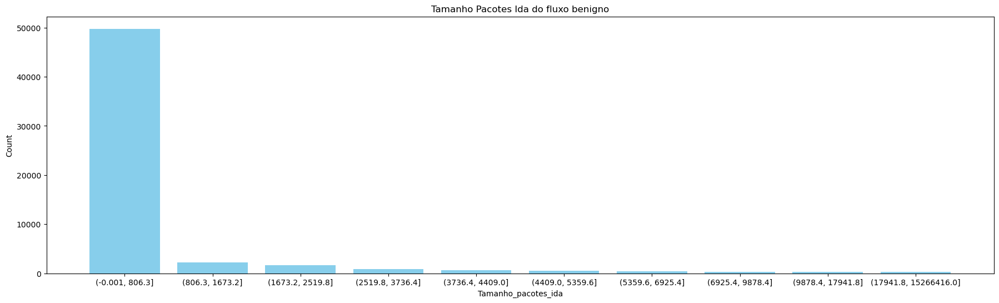

In [54]:
# TAMANHO DOS PACOTES EM DIREÇÃO DE IDA

# normal flow
df_UNF = get_df_unique(normalFlow, columns[11], ("Tamanho_pacotes_ida","Count"), order=0)

df_UNF["Tamanho_pacotes_ida"] = pd.qcut(df_UNF["Tamanho_pacotes_ida"], q=10)
tabela = df_UNF.groupby(df_UNF["Tamanho_pacotes_ida"])["Count"].sum().reset_index(name="Count")

tabela["Tamanho_pacotes_ida"] = tabela["Tamanho_pacotes_ida"].astype(str) # Converter tamanhos para string

make_graph(1, tabela, "Tamanho_pacotes_ida", "Count", (22,6), "Tamanho Pacotes Ida do fluxo benigno")


# df_UNF

In [56]:
# DDoS Flow

df_UDF = get_df_unique(ddosFlow, columns[11], ("Tamanho_pacotes_ida", "Count"), 1)
df_UDF["Tamanho_pacotes_ida"] = pd.qcut(df_UDF["Tamanho_pacotes_ida"], q=10)
tabela = df_UDF.groupby(df_UDF["Tamanho_pacotes_ida"])["Count"].sum().reset_index(name="Count")

tabela["Tamanho_pacotes_ida"] = tabela["Tamanho_pacotes_ida"].astype(str)
# tabela

make_graph(1,tabela, "Tamanho_pacotes_ida", "Count", (20,6), "Tamanho dos pacotes ida maligno")


IndexError: index -1 is out of bounds for axis 0 with size 0

In [59]:

make_graph(3, df, columns[11], "Count", (20,6), "Tamanho do pacote ida", 0,3000)

###### Volta

In [58]:
# TAMANHO DOS PACOTES NA DIREÇÃO DE VOLTA

# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[12], ("Tamanho_Total_pacotes_volta","Count"), 1)
df_UNF

# df_UNF["Tamanho_Total_pacotes_volta"] = pd.qcut(df_UNF["Tamanho_Total_pacotes_volta"], q=10)
# tabela = df_UNF.groupby(df_UNF["Tamanho_Total_pacotes_volta"])["Count"].sum().reset_index(name="Count")
# tabela["Tamanho_Total_pacotes_volta"] = tabela["Tamanho_Total_pacotes_volta"].astype(str)

# make_graph(1, tabela, "Tamanho_Total_pacotes_volta", "Count", (20,6), "Tamanho pacotes volta benigno")

,Tamanho_Total_pacotes_volta,Count
0,0.0,26267
73,204.0,1137
20,92.0,1132
32,118.0,855
21,94.0,800
...,...,...
1255,9060.0,1
1254,9058.0,1
1253,9050.0,1
1252,9046.0,1


In [43]:
# DDoS Flow

df_UDF = get_df_unique(ddosFlow, columns[12], ("Tamanho_Total_pacotes_volta", "Count"), 1)
df_UDF


# df_UDF["Tamanho_Total_pacotes_volta"] = pd.qcut(df_UDF["Tamanho_Total_pacotes_volta"], q=10)
# tabela = df_UDF.groupby(df_UDF["Tamanho_Total_pacotes_volta"])["Count"].sum().reset_index(name="Count")
# tabela["Tamanho_Total_pacotes_volta"] = tabela["Tamanho_Total_pacotes_volta"].astype(str)

# make_graph(1, tabela, "Tamanho_Total_pacotes_volta", "Count", (20,6), "Tamanho dos pacotes de volta maligno")

,Tamanho_Total_pacotes_volta,Count
0,0.0,4395516
8,2146.0,38
14,4290.0,33
11,2834.0,14
17,4378.0,5
10,2698.0,5
1,52.0,2
12,3970.0,2
7,440.0,2
3,104.0,2


In [62]:
# Gráfico da base completa

make_graph(3, df, columns[12], "Count", (20,6), "Tamanho dos pacotes de volta", 0, 3000)

##### Comprimento (Máx./Min./Med.) dos pacotes na direção de ida

###### máximo 

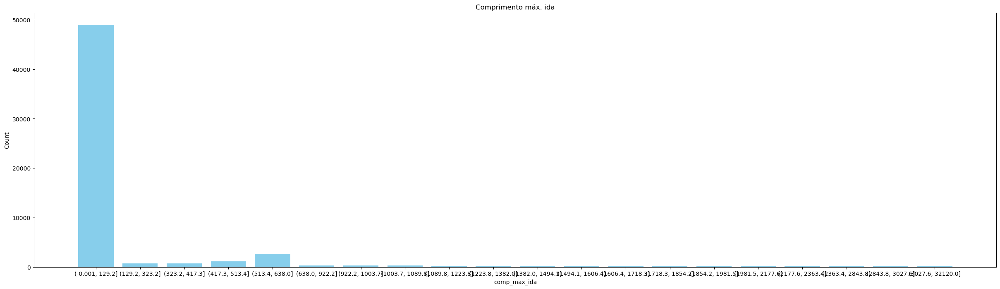

In [63]:
# Fluxo normal

df_UNF = get_df_unique(normalFlow, columns[13], ("comp_max_ida", "Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[13], ("comp_max_ida", "Count"), 20, 1, False, (30,8), "Comprimento máx. ida")

In [ ]:
# Fluxo DDoS

# df_UDF = get_df_unique(ddosFlow, columns[13], ("comp_max_ida", "Count"), 1)
# df_UDF["comp_max_ida"] = pd.qcut(df_UDF["comp_max_ida"], q=20)


# tabela = df_UDF.groupby(df_UDF["comp_max_ida"])["Count"].sum().reset_index(name="Count")
# tabela["comp_max_ida"] = tabela["comp_max_ida"].astype(str)

# make_graph(1, tabela, "comp_max_ida", "Count", (35, 6), "comprimento max ida")

df_UDF = get_df_unique(ddosFlow, columns[13], ("comp_max_ida", "Count"), 1)
df_UDF

analytic_data_std(ddosFlow, columns[13], ("comp_max_ida", "Count"), 10, 1, False, (30,8), "Comprimento máx. ida")

In [ ]:
# Gráfico da base completa

make_graph(3, df, columns[13], "Count", (20,6), "comprimento máximo dos pacotes ida", 0, len(df))

###### mínimo

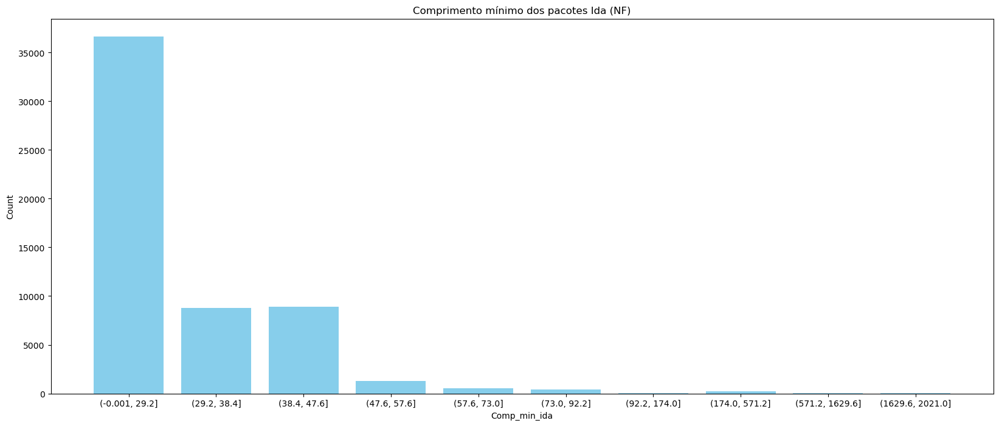

In [97]:
# Mínimo - Normal Flow

df_UNF = get_df_unique(normalFlow, columns[14], ("Comp_min_ida", "Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[14], ("Comp_min_ida", "Count"), 10, 1, False, (20, 8), "Comprimento mínimo dos pacotes Ida (NF)")

In [96]:
# Mínimo - DDos Flow

df_UDF = get_df_unique(ddosFlow, columns[14], ("Comp_min_ida","Count"))
df_UDF

analytic_data_std(ddosFlow, columns[14], ("Comp_min_ida", "Count"), 20, 1, False, (20, 8), "Comprimento mínimo dos pacotes Ida (DF)")

IndexError: index -1 is out of bounds for axis 0 with size 0

In [69]:
# Gráfico da base completa

make_graph(3, df, columns[14], "Count", (20,6), "comprimento min. ida", 0, len(df))

###### Médio

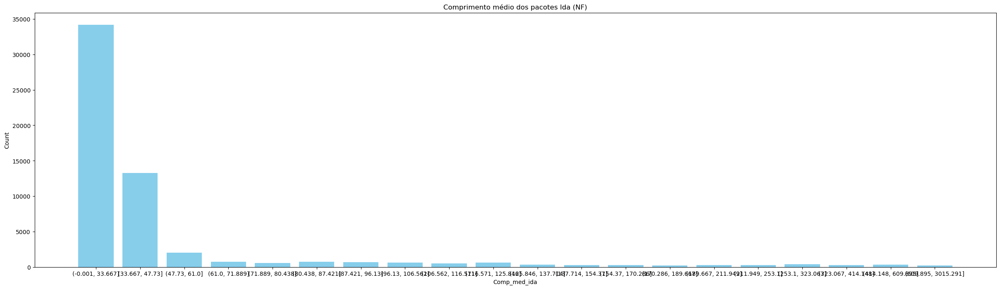

In [70]:
# Médio - normal flow

df_UNF = get_df_unique(normalFlow, columns[15], ("Comp_med_ida", "Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[15], ("Comp_med_ida", "Count"), 20, 1, False, (30, 8), "Comprimento médio dos pacotes Ida (NF)")

In [71]:
# Médio - ddos flow

# df_UDF = get_df_unique(ddosFlow, columns[15], ("Comp_med_ida", "Count"), 1)

# df_UDF["Comp_med_ida"] = pd.qcut(df_UDF["Comp_med_ida"], q=20)
# tabela = df_UDF.groupby(df_UDF["Comp_med_ida"])["Count"].sum().reset_index(name="Count")
# tabela["Comp_med_ida"] = tabela["Comp_med_ida"].astype(str)

# make_graph(1, tabela, "Comp_med_ida", "Count", (35,6))

df_UDF = get_df_unique(ddosFlow, columns[15], ("Comp_med_ida","Count"))
df_UDF

analytic_data_std(ddosFlow, columns[15], ("Comp_med_ida", "Count"), 20, 1, False, (30, 8), "Comprimento médio dos pacotes Ida (DF)")

IndexError: index -1 is out of bounds for axis 0 with size 0

In [98]:
# Gráfico da base completa

make_graph(3, df, columns[15], "Count", (20,6), "Comprimento med. ida", 0, len(df))

##### Comprimento (Max., Min., Med.) na direção de volta

###### Max

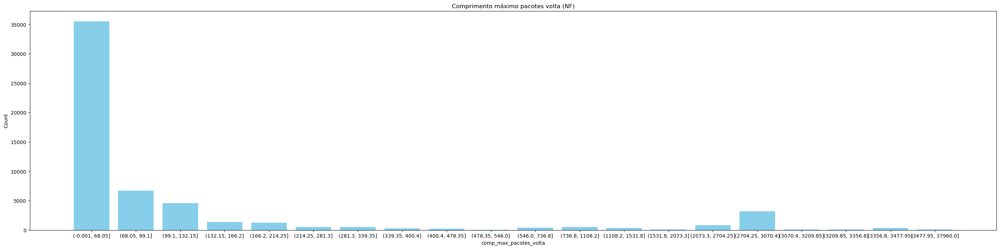

In [76]:
# Max - Normal Flow 

# df_UNF = get_df_unique(normalFlow, columns[17], ("Comp_max_volta","Count"), 1)
# df_UNF = df_UNF.iloc[1:, :] # foi retirado o tamanho "0" que foi predominante o maior dentre eles

# df_UNF["Comp_max_volta"] = pd.qcut(df_UNF["Comp_max_volta"], q=20)
# tabela = df_UNF.groupby(df_UNF["Comp_max_volta"])["Count"].sum().reset_index(name="Count")

# tabela["Comp_max_volta"] = tabela["Comp_max_volta"].astype(str)

# make_graph(1, tabela, "Comp_max_volta", "Count", (35,6))


df_UNF = get_df_unique(normalFlow, columns[17], ("comp_max_pacotes_volta", "Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[17], ("comp_max_pacotes_volta","Count"), 20, 1, False , (35,8), "Comprimento máximo pacotes volta (NF)", 0)



In [77]:
# Max - DDoS Flow

# df_UDF = get_df_unique(ddosFlow, columns[17], ("Comp_max_volta", "Count"), 1)
# df_UDF = df_UDF.iloc[1:, :] # foi retirado o tamanho "0" que foi predominante o maior dentre eles

# # make_graph(1, df_UDF.iloc[1:16], "Comp_max_volta", "Count", (10,6))

# df_UDF["Comp_max_volta"] = pd.qcut(df_UDF["Comp_max_volta"], q=20)
# tabela = df_UDF.groupby(df_UDF["Comp_max_volta"])["Count"].sum().reset_index(name="Count")

# tabela["Comp_max_volta"] = tabela["Comp_max_volta"].astype(str)

# make_graph(1, tabela, "Comp_max_volta", "Count", (35,6))


df_UDF = get_df_unique(ddosFlow, columns[17], ("comp_max_pacotes_volta", "Count"), 1)
df_UDF

analytic_data_std(ddosFlow, columns[17], ("comp_max_pacotes_volta","Count"), 20, 1, False , (30,8), "Comprimento máximo pacotes volta (DF)", 0)

IndexError: index -1 is out of bounds for axis 0 with size 0

In [79]:
# Gráfico da base completa

make_graph(3, df, columns[17], "Count", (20,6), "Comprimento máximo pacotes volta", 0, 3000)

# df_final[columns[17]]

###### Mínimo

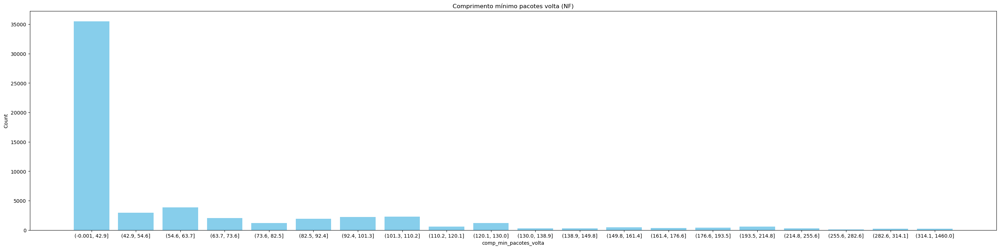

In [80]:
# Normal flow

df_UNF = get_df_unique(normalFlow, columns[18], ("comp_min_pacotes_volta", "Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[18], ("comp_min_pacotes_volta","Count"), 20, 1, False , (35,8), "Comprimento mínimo pacotes volta (NF)", 0)

In [ ]:
# ddos flow

df_UDF = get_df_unique(ddosFlow, columns[18], ("comp_min_pacotes_volta", "Count"), 1)
df_UDF

# analytic_data_std(ddosFlow, columns[18], ("comp_min_pacotes_volta","Count"), 20, 1, False , (35,8), "Comprimento mínimo pacotes volta (NF)", 0)

,comp_min_pacotes_volta,Count
0,0.0,34690
63,102.0,1138
10,46.0,874
22,59.0,859
11,47.0,802
...,...,...
148,247.0,1
145,231.0,1
175,1029.0,1
176,1371.0,1


###### Médio

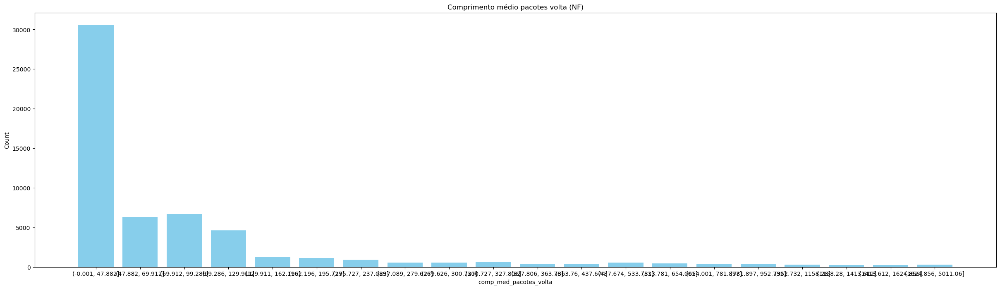

In [84]:
# Med - Normal Flow

df_UNF = get_df_unique(normalFlow, columns[19], ("comp_med_volta", "Count"), 1)
df_UNF = df_UNF.iloc[1:, :] # Foi retirado o tamanho "0" que foi predominante o maior dentre eles

df_UNF["comp_med_volta"] = pd.qcut(df_UNF["comp_med_volta"], q=20)
df_UNF = df_UNF.groupby("comp_med_volta")["Count"].sum().reset_index(name="Count")

df_UNF["comp_med_volta"] = df_UNF["comp_med_volta"].astype(str)


# make_graph(1, df_UNF, "comp_med_volta", "Count", (37,6), "COMP. MED. PACOTES VOLTA -- NORMAL FLOW")

analytic_data_std(normalFlow, columns[19], ("comp_med_pacotes_volta","Count"), 20, 1, False , (30,8), "Comprimento médio pacotes volta (NF)", 0)




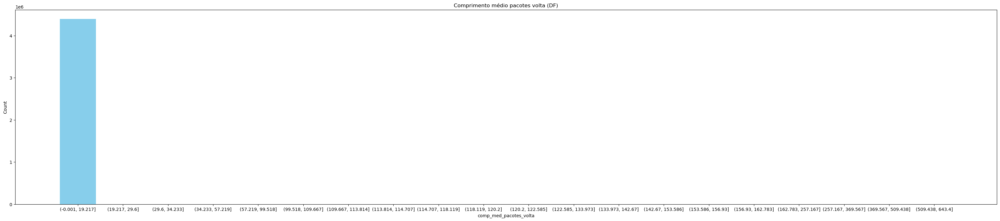

In [61]:
# Med - DDoS Flow

df_UDF = get_df_unique(ddosFlow, columns[19], ("comp_med_volta", "Count"), 1)
df_UDF = df_UDF.iloc[1:, :] # Foi retirado o tamanho "0" que foi predominante o maior dentre eles

df_UDF["comp_med_volta"] = pd.qcut(df_UDF["comp_med_volta"], q=20)
df_UDF = df_UDF.groupby("comp_med_volta")["Count"].sum().reset_index(name="Count")

df_UDF["comp_med_volta"] = df_UDF["comp_med_volta"].astype(str)


# make_graph(1, df_UDF, "comp_med_volta", "Count", (37,6), "COMP. MED. PACOTES VOLTA -- NORMAL FLOW")

analytic_data_std(ddosFlow, columns[19], ("comp_med_pacotes_volta","Count"), 20, 1, False , (40,8), "Comprimento médio pacotes volta (DF)", 0)



In [95]:
# Gráfico da base completa
make_graph(3, df, columns[19], "Count", (20,6), "Comprimento médio dos pacotes volta", 0, len(df))

##### Taxa de Fluxo

###### Em Bytes

In [131]:
# Normal Flow

df_UNF = get_df_unique(normalFlow, columns[21], ("Taxa_fluxo_bytes", "Count"), 1)
df_UNF

# normalFlow[normalFlow[columns[21]].isna()]
# analytic_data_std(normalFlow, columns[21], ("Taxa_fluxo_bytes", "Count"), 20, 1, False, (50,8), "Taxa de fluxo de bytes p/segundo (NF)", 0)


,Taxa_fluxo_bytes,Count
0,0.000000e+00,17435
30762,3.100000e+07,2020
30877,inf,325
30740,1.550000e+07,168
30878,NaN,113
...,...,...
10388,4.033162e+03,1
10387,4.032744e+03,1
10386,4.032484e+03,1
10385,4.032258e+03,1


In [132]:
# DDoS Flow

df_UDF = get_df_unique(ddosFlow, columns[21], ("Taxa_fluxo_bytes", "Count"), 1)
df_UDF

# analytic_data_std(ddosFlow, columns[21], ("Taxa_fluxo_bytes", "Count"), 20, 1, False, (55,8), "Taxa de fluxo de bytes p/segundo (DF)", 0)

,Taxa_fluxo_bytes,Count


In [133]:
# Gráfico da base completa 
df[columns[21]]

make_graph(3, df, columns[21], "Count", (20,6), "Taxa de fluxo de bytes", 0, MAX_LINES)

###### Em pacotes

In [134]:
# Normal Flow

df_UNF = get_df_unique(normalFlow, columns[22], ("Taxa_fluxo_pacotes_p/s", "Count"), 1)
df_UNF

# analytic_data_std(normalFlow, columns[22], ("taxa_fluxo_pacotes_ps", "Count"), 20, 1, False, (45,6), "Taxa de fluxo de pacotes p/segundo", 0)


,Taxa_fluxo_pacotes_p/s,Count
25376,2.000000e+06,3177
25371,1.000000e+06,1446
25368,7.500000e+05,694
25378,inf,438
25366,6.666667e+05,356
...,...,...
8387,3.325057e+00,1
8386,3.324280e+00,1
8385,3.321328e+00,1
8384,3.318282e+00,1


In [105]:
df_UDF = get_df_unique(ddosFlow, columns[22], ("Taxa_fluxo_pacotes_p/s", "Count"), 1)
df_UDF

# analytic_data_std(ddosFlow, columns[22], ("taxa_fluxo_pacotes_p/s", "Count"), 20, 1, False, (45,6), "Taxa de fluxo de pacotes p/segundo", 0 )

,Taxa_fluxo_pacotes_p/s,Count


In [109]:
# Gráfico da base completa 
normalFlow[columns[22]]

make_graph(3, df, columns[22], "Count", (20,6), "Taxa de fluxo de pacotes", 0,MAX_LINES)

###### Tempo médio entre as chegada de pacotes 

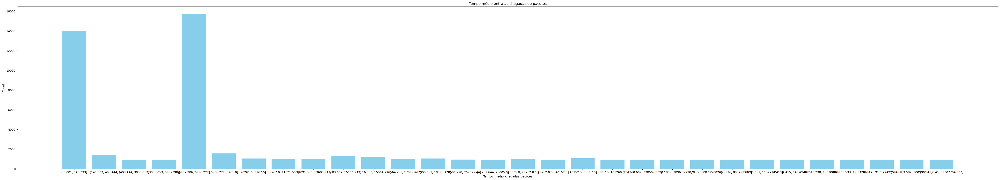

In [129]:
# Normal flow
df_UNF = get_df_unique(normalFlow, columns[23], ("Tempo_medio_chegadas_pacotes","Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[23], ("Tempo_medio_chegadas_pacotes","Count"), 30, 1, False, (60,10), "Tempo médio entra as chegadas de pacotes", 0)

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[23], ("Tempo_medio_chegadas_pacotes_p/s","Count"), 1)
df_UDF  

analytic_data_std(ddosFlow, columns[23], ("Tempo_medio_chegadas_pacotes_p/s","Count"), 30, 1, False, (60,10), "Tempo médio chegada de pacotes por segundo", 0)


,Tempo_medio_chegadas_pacotes_p/s,Count


In [121]:
# Gráfico da base completa 
df[columns[23]]

make_graph(3, df, columns[23], "Count", (20,6), "Tempo_medio_chegadas_pacotes", 0, MAX_LINES)

###### Desvio padrão

In [120]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[24], ("desvio_padrao_t_chegada_do_pacotes", "Count"), 1)
df_UNF

# analytic_data_std(normalFlow, columns[24], ("desvio_padrao_t_chegada_do_pacotes", "Count"), 20, 1, False, (50,6), "Desvio_padrao_temp_chegada_dos_pacotes", False)

,desvio_padrao_t_chegada_do_pacotes,Count
0,0.000000e+00,7385
3,7.071068e-01,689
8,1.414214e+00,678
14,2.121320e+00,145
6,1.154701e+00,135
...,...,...
10658,2.358680e+04,1
10657,2.358649e+04,1
10655,2.358591e+04,1
10654,2.358582e+04,1


In [122]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[24], ("desvio_padrao_t_chegada_do_pacotes", "Count" ), 1)
df_UDF
# analytic_data_std(ddosFlow, columns[24], ("desvio_padrao_t_chegada_do_pacotes", "Count"), 20, 1, False, (50,6), "Desvio_padrao_temp_chegada_dos_pacotes", False)

,desvio_padrao_t_chegada_do_pacotes,Count


In [127]:
# Gráfico da base completa 
df[columns[24]]

make_graph(3, df, columns[24], "Count", (20,6), "desvio padrão do tempo de chegada dos pacotes", 0,3000)

##### Tempo entre as chegadas do pacotes

###### máximo

In [124]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[25], ("Tempo_maximo_entre_chegada_do_pacotes", "Count"), 1)
df_UNF

# analytic_data_std(normalFlow, columns[25], ("Tempo_maximo_entre_chegada_do_pacotes", "Count"), 20, 1, False, (50,6), "Tempo maximo entre as chegadas do pacotes", False)

,Tempo_maximo_entre_chegada_do_pacotes,Count
1,1.0,3580
2,2.0,1450
3,3.0,1265
0,0.0,438
4,4.0,203
...,...,...
9892,60785.0,1
9891,60778.0,1
9890,60773.0,1
9889,60762.0,1


In [125]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[25], ("Tempo_maximo_entre_chegada_do_pacotes", "Count"), 0)
df_UDF

# analytic_data_std(normalFlow, columns[25], ("Tempo_maximo_entre_chegada_do_pacotes", "Count"), 20, 1, False, (50,6), "Tempo maximo entre as chegadas do pacotes", False)

,Tempo_maximo_entre_chegada_do_pacotes,Count


In [113]:
# Gráfico da base completa 
df[columns[25]]

make_graph(3, df, columns[25], "Count", (20,6), "Tempo maximo entre as chegadas do pacotes", 0, MAX_LINES)

###### Mínimo


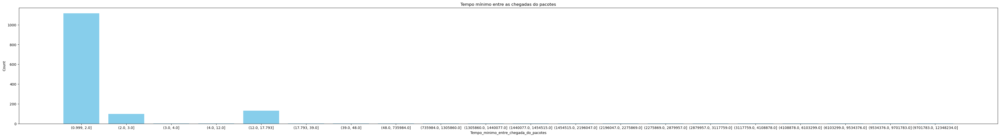

In [115]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[26], ("Tempo_minimo_entre_chegada_do_pacotes", "Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[26], ("Tempo_minimo_entre_chegada_do_pacotes", "Count"), 20, 1, False, (50,6), "Tempo mínimo entre as chegadas do pacotes", False)

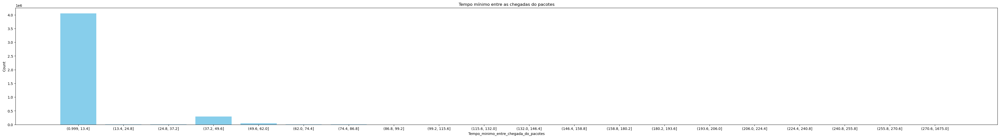

In [116]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[26], ("Tempo_minimo_entre_chegada_do_pacotes", "Count"), 1)
df_UDF

analytic_data_std(ddosFlow, columns[26], ("Tempo_minimo_entre_chegada_do_pacotes", "Count"), 20, 1, False, (50,6), "Tempo mínimo entre as chegadas do pacotes", False)

In [118]:
# Gráfico da base completa 
# df_final[columns[26]]

make_graph(3, df, columns[26], "Count", (20,6), "Tempo mínimo entre as chegadas do pacotes", 0, MAX_LINES)

###### Total

In [163]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[27], ("Tempo_total_entre_chegada_do_pacotes", "Count"), 1)
df_UNF

# analytic_data_std(normalFlow, columns[27], ("Tempo_total_entre_chegada_do_pacotes", "Count"), 20, 1, False, (50,6), "Tempo Total entre as chegadas do pacotes", False)

,Tempo_total_entre_chegada_do_pacotes,Count
0,1.000000e+00,378
1,2.000000e+00,234
2,3.000000e+00,157
3,4.000000e+00,26
96,7.984765e+03,11
...,...,...
180,1.082670e+05,1
179,1.034670e+05,1
178,9.692300e+04,1
177,9.349300e+04,1


In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[27], ("Tempo_total_entre_chegada_do_pacotes", "Count"), 1 )
df_UDF

# analytic_data_std(ddosFlow, columns[27], ("Tempo_total_entre_chegada_do_pacotes", "Count"), 40, 1, False, (50,6), "Tempo Total entre as chegadas do pacotes", 0)

,Tempo_total_entre_chegada_do_pacotes,Count
0,1.0,3533341
1,2.0,484586
47,48.0,113256
48,49.0,65354
46,47.0,56835
...,...,...
1676,3154359.0,1
1677,3154882.0,1
1678,3155730.0,1
1679,3162512.0,1


In [129]:
# Gráfico da base completa 
# df_final[columns[27]]

make_graph(3, df, columns[27], "Count", (20,6), "Tempo total entre as chegadas do pacotes", 0, MAX_LINES)

###### Medio

In [130]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[28], ("Tempo_medio_entre_chegada_do_pacotes", "Count"), 1)
df_UNF
# analytic_data_std(normalFlow, columns[28], ("Tempo_medio_entre_chegada_do_pacotes", "Count"), 20, 1, False, (50,6), "Tempo Medio entre as chegadas do pacotes", False)

,Tempo_medio_entre_chegada_do_pacotes,Count
0,1.000000e+00,379
1,2.000000e+00,235
2,3.000000e+00,158
5,4.000000e+00,24
99,2.215125e+03,11
...,...,...
175,1.424300e+04,1
174,1.382500e+04,1
173,1.374340e+04,1
172,1.315634e+04,1


In [131]:
# Normal Flow
df_UDF = get_df_unique(ddosFlow, columns[28], ("Tempo_medio_entre_chegada_dos_pacotes", "Count"), 1)
df_UDF

# analytic_data_std(ddosFlow, columns[28], ("Tempo_medio_entre_chegada_dos_pacotes", "Count"), 20, 1, False, (50,6), "Tempo Medio entre as chegadas dos pacotes", False)

,Tempo_medio_entre_chegada_dos_pacotes,Count
3,1.000000e+00,3533374
5,2.000000e+00,484577
97,4.800000e+01,113253
98,4.900000e+01,65351
96,4.700000e+01,56835
...,...,...
1693,1.000031e+06,1
1694,1.000033e+06,1
1695,1.000040e+06,1
1696,1.000044e+06,1


In [134]:
# Gráfico da base completa 
# df_final[columns[28]]

make_graph(3, df, columns[28], "Count", (20,6), "Tempo médio entre as chegadas do pacotes", 0, 5000)

##### Tempo entre as chegadas dos pacotes Ida

###### Maximo

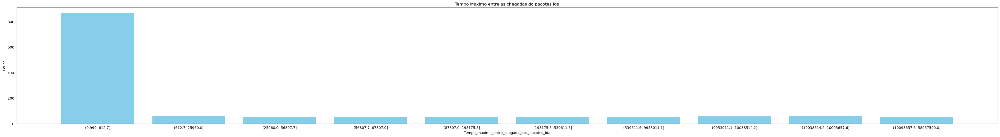

In [135]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[30], ("Tempo_maximo_entre_chegada_dos_pacotes_ida", "Count"), 1)
df_UNF
analytic_data_std(normalFlow, columns[30], ("Tempo_maximo_entre_chegada_dos_pacotes_ida", "Count"), 10, 1, False, (50,6), "Tempo Maximo entre as chegadas do pacotes Ida", False)

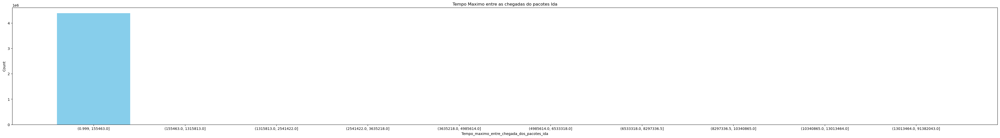

In [136]:
# DDos Flow
df_UDF = get_df_unique(ddosFlow, columns[30], ("Tempo_maximo_entre_chegada_dos_pacotes_ida", "Count"), 1)
df_UDF
analytic_data_std(ddosFlow, columns[30], ("Tempo_maximo_entre_chegada_dos_pacotes_ida", "Count"), 10, 1, False, (50,6), "Tempo Maximo entre as chegadas do pacotes Ida", False)

In [138]:
# Gráfico da base completa 
# [columns[28]]

make_graph(3, df, columns[28], "Count", (20,6), "Tempo médio entre as chegadas do pacotes", 0, 500)

###### Minimo

In [139]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[31], ("Tempo_minimo_entre_chegada_dos_pacotes_ida", "Count"), 1)
df_UNF
# analytic_data_std(normalFlow, columns[31], ("Tempo_minimo_entre_chegada_dos_pacotes_ida", "Count"), 20, 1, False, (50,6), "Tempo mínimo entre as chegadas do pacotes Ida", False)

,Tempo_minimo_entre_chegada_dos_pacotes_ida,Count
0,1.000000e+00,734
1,2.000000e+00,303
2,3.000000e+00,174
9,1.786364e+01,82
3,4.000000e+00,24
14,4.700000e+01,6
16,4.900000e+01,6
5,6.000000e+00,5
15,4.800000e+01,3
4,5.000000e+00,3


In [140]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[31], ("Tempo_minimo_entre_chegada_dos_pacotes_ida", "Count"), 1)
df_UDF
# analytic_data_std(ddosFlow, columns[31], ("Tempo_minimo_entre_chegada_dos_pacotes_ida", "Count"), 20, 1, False, (50,6), "Tempo mínimo entre as chegadas do pacotes Ida", False)

,Tempo_minimo_entre_chegada_dos_pacotes_ida,Count
0,1.0,3537312
1,2.0,484771
48,48.0,113258
49,49.0,65352
47,47.0,56840
...,...,...
191,211.0,1
190,210.0,1
184,204.0,1
181,201.0,1


In [141]:
# Gráfico da base completa 
# df_final[columns[31]]

make_graph(3, df, columns[31], "Count", (20,6), "Tempo mínimo entre as chegadas do pacotes IDA", 0, 3000)

###### Medio

In [142]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[33], ("Tempo_medio_entre_chegada_dos_pacotes_ida", "Count"), 1)
df_UNF
# analytic_data_std(normalFlow, columns[33], ("Tempo_medio_entre_chegada_dos_pacotes_ida", "Count"), 20, 1, False, (50,6), "Tempo medio entre as chegadas do pacotes Ida", False)

,Tempo_medio_entre_chegada_dos_pacotes_ida,Count
0,-1,1363


In [143]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[33], ("Tempo_medio_entre_chegada_dos_pacotes_ida", "Count"), 1)
df_UDF
# analytic_data_std(ddosFlow, columns[33], ("Tempo_medio_entre_chegada_dos_pacotes_ida", "Count"), 20, 1, False, (50,6), "Tempo medio entre as chegadas do pacotes Ida", False)

,Tempo_medio_entre_chegada_dos_pacotes_ida,Count
0,-1,4395633


In [144]:
# Gráfico da base completa 
# df_final[columns[33]]

make_graph(3, df, columns[33], "Count", (20,6), "Tempo médio entre as chegadas do pacotes IDA", 0, 3000)

##### Tempo entre as chegadas dos pacotes volta

###### maximo

In [145]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[35], ("Tempo_maximo_entre_chegada_dos_pacotes_volta", "Count"), 1)
df_UNF
# analytic_data_std(normalFlow, columns[35], ("Tempo_maximo_entre_chegada_dos_pacotes_volta", "Count"), 20, 1, False, (50,6), "Tempo maximo entre as chegadas do pacotes volta", False)

,Tempo_maximo_entre_chegada_dos_pacotes_volta,Count
0,-1,1363


In [146]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[35], ("Tempo_maximo_entre_chegada_dos_pacotes_volta", "Count"), 1)
df_UDF
# analytic_data_std(ddosFlow, columns[35], ("Tempo_maximo_entre_chegada_dos_pacotes_volta", "Count"), 20, 1, False, (50,6), "Tempo maximo entre as chegadas do pacotes volta", False)

,Tempo_maximo_entre_chegada_dos_pacotes_volta,Count
0,-1,4395633


In [149]:
# Gráfico da base completa 
# df_final[columns[35]]

make_graph(3, df, columns[35], "Count", (20,6), "Tempo máximo entre as chegadas do pacotes VOLTA", 0, 3000)

###### minimo

In [150]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[36], ("Tempo_minimo_entre_chegada_dos_pacotes_volta", "Count"), 1)
df_UNF
# analytic_data_std(normalFlow, columns[36], ("Tempo_minimo_entre_chegada_dos_pacotes_volta", "Count"), 20, 1, False, (50,6), "Tempo minimo entre as chegadas do pacotes volta", False)

,Tempo_minimo_entre_chegada_dos_pacotes_volta,Count
0,-1,1363


In [151]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[36], ("Tempo_minimo_entre_chegada_dos_pacotes_volta", "Count"), 1)
df_UDF
# analytic_data_std(ddosFlow, columns[36], ("Tempo_minimo_entre_chegada_dos_pacotes_volta", "Count"), 20, 1, False, (50,6), "Tempo minimo entre as chegadas do pacotes volta", False)

,Tempo_minimo_entre_chegada_dos_pacotes_volta,Count
0,-1,4395633


In [152]:
# Gráfico da base completa 

make_graph(3, df, columns[36], "Count", (20,6), "Tempo mínimo entre as chegadas do pacotes VOLTA", 0, 3000)

###### medio

In [156]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[33], ("Tempo_medio_entre_chegada_dos_pacotes_volta", "Count"), 1)
df_UNF
# analytic_data_std(normalFlow, columns[34], ("Tempo_medio_entre_chegada_dos_pacotes_volta", "Count"), 20, 1, False, (50,6), "Tempo medio entre as chegadas do pacotes volta", False)

,Tempo_medio_entre_chegada_dos_pacotes_volta,Count
0,-1,1363


In [155]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[33], ("Tempo_medio_entre_chegada_dos_pacotes_volta", "Count"), 1)
df_UDF
# analytic_data_std(ddosFlow, columns[34], ("Tempo_medio_entre_chegada_dos_pacotes_volta", "Count"), 20, 1, False, (50,6), "Tempo medio entre as chegadas do pacotes volta", False)

,Tempo_medio_entre_chegada_dos_pacotes_volta,Count
0,-1,4395633


In [153]:
# Gráfico da base completa 

make_graph(3, df, columns[33], "Count", (20,6), "Tempo médio entre as chegadas do pacotes VOLTA", 0, 3000)

##### Flags PSH

###### Ida

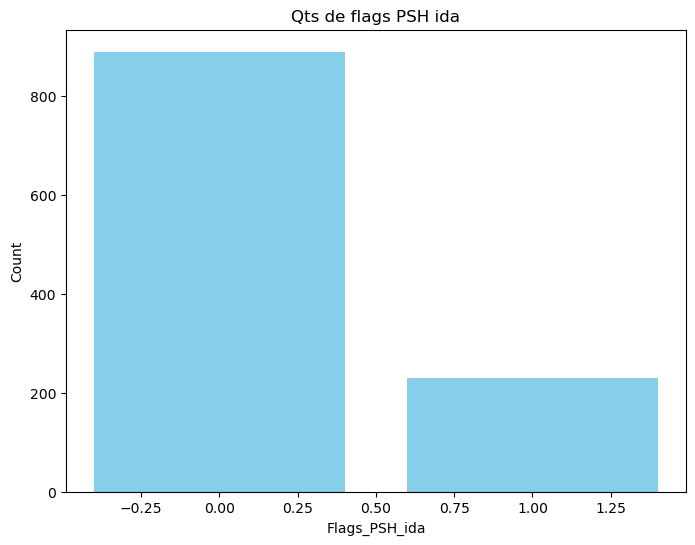

In [573]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[37], ("Flags_PSH_ida","Count"),1)
df_UNF

df_UNF = make_graph(1, df_UNF, "Flags_PSH_ida", "Count", (8,6), "Qts de flags PSH ida")

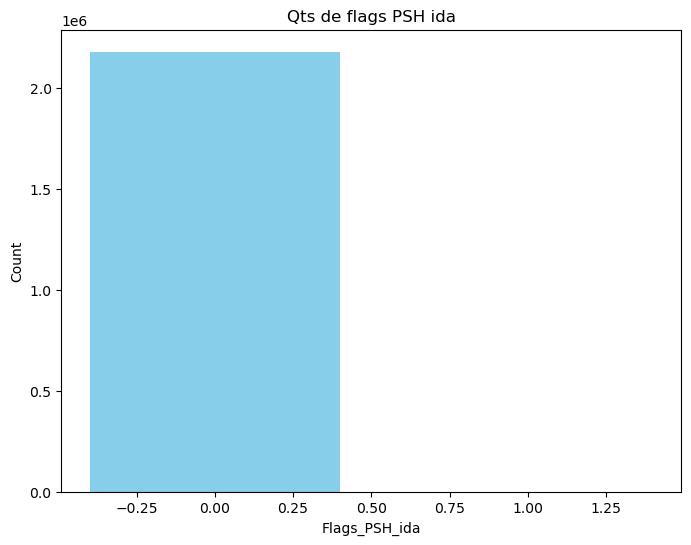

In [574]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[37], ("Flags_PSH_ida","Count"),1)
df_UDF

df_UDF = make_graph(1, df_UDF, "Flags_PSH_ida", "Count", (8,6), "Qts de flags PSH ida")

In [575]:
# Gráfico da base completa 
df_final[columns[37]]

make_graph(3, df_final, columns[37], "Count", (20,6), "FLAGS PSH IDA", 0, 3000)

###### Volta

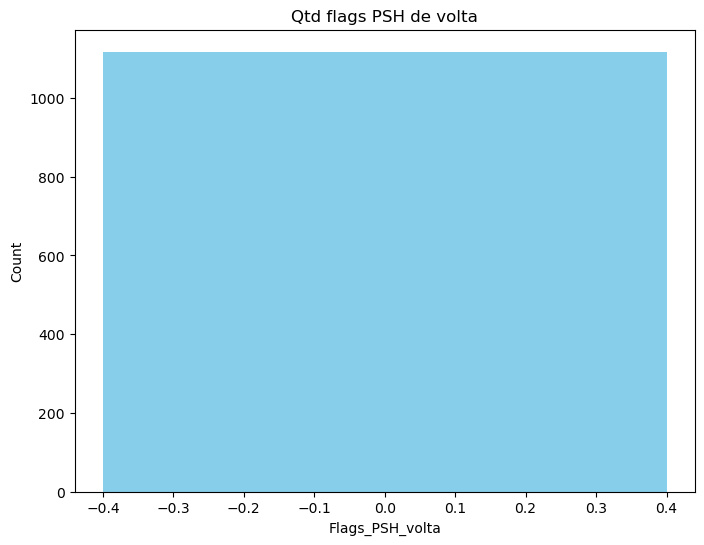

In [576]:
# Normal Flow

df_UNF = get_df_unique(normalFlow, columns[38], ("Flags_PSH_volta", "Count"), 1)
df_UNF

make_graph(1, df_UNF, "Flags_PSH_volta", "Count", (8,6), "Qtd flags PSH de volta")

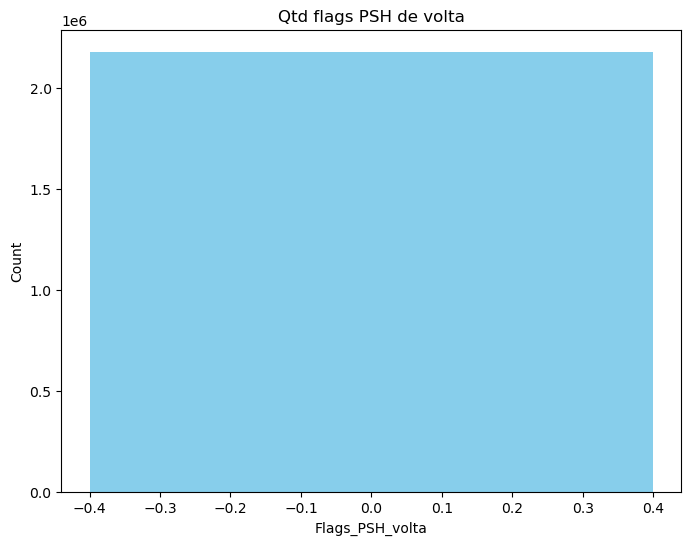

In [577]:
# DDoS Flow

df_UDF = get_df_unique(ddosFlow, columns[38], ("Flags_PSH_volta", "Count"), 1)
df_UDF

make_graph(1, df_UDF, "Flags_PSH_volta", "Count", (8,6), "Qtd flags PSH de volta")

In [578]:
# Gráfico da base completa 
df_final[columns[38]]

make_graph(3, df_final, columns[38], "Count", (20,6), "FLAG PSH VOLTA", 0, 3000)

##### Flag URG

###### Ida

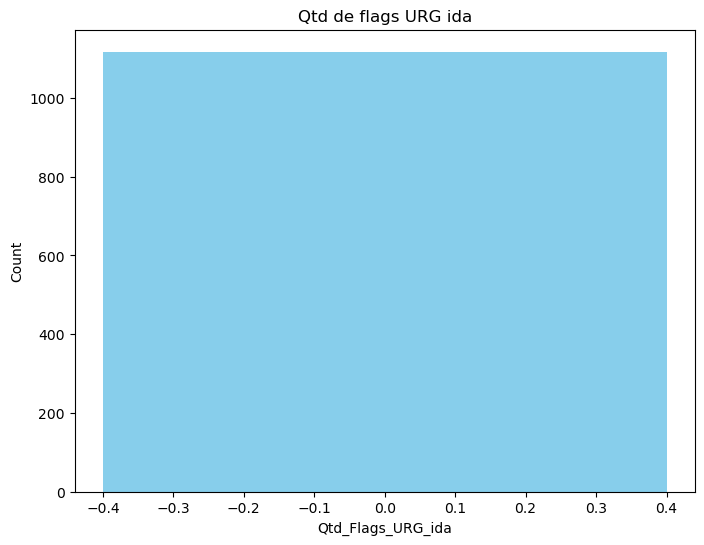

In [579]:
df_UNF = get_df_unique(normalFlow, columns[39], ("Qtd_Flags_URG_ida","Count"), 1)
df_UNF

make_graph(1, df_UNF, "Qtd_Flags_URG_ida", "Count", (8,6), "Qtd de flags URG ida")

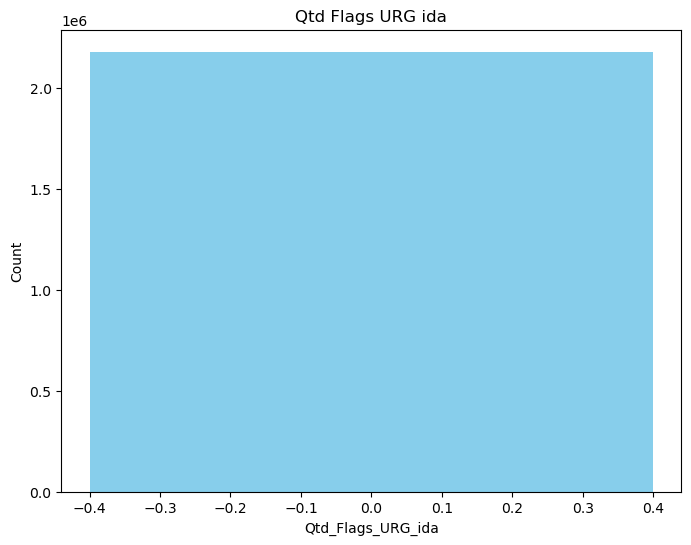

In [580]:
# DDoS Flow

df_UDF = get_df_unique(ddosFlow, columns[39], ("Qtd_Flags_URG_ida", "Count"), 1)
df_UDF

make_graph(1, df_UDF, "Qtd_Flags_URG_ida", "Count", (8,6), "Qtd Flags URG ida")


In [581]:
# Gráfico da base completa 
df_final[columns[39]]

make_graph(3, df_final, columns[39], "Count", (20,6), "FLAG URG IDA", 0, 3000)

###### Volta

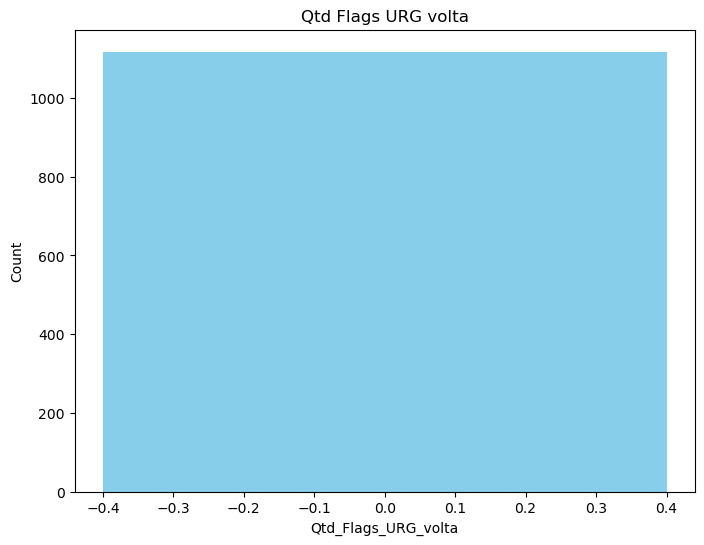

In [582]:
# Normal Flow

df_UNF = get_df_unique(normalFlow, columns[40], ("Qtd_Flags_URG_volta","Count"), 1)
df_UNF

make_graph(1, df_UNF, "Qtd_Flags_URG_volta", "Count", (8,6), "Qtd Flags URG volta")

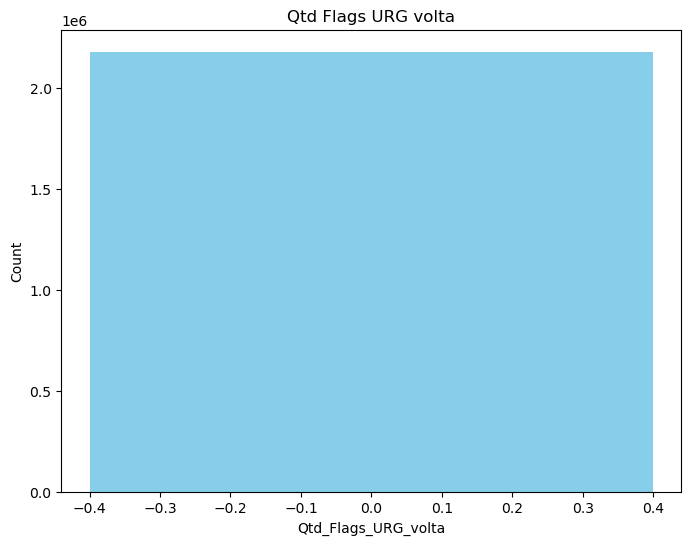

In [583]:
# DDoS Flow

df_UDF = get_df_unique(ddosFlow, columns[40], ("Qtd_Flags_URG_volta","Count"), 1)
df_UDF

make_graph(1, df_UDF, "Qtd_Flags_URG_volta", "Count", (8,6), "Qtd Flags URG volta")

In [584]:
# Gráfico da base completa 
df_final[columns[40]]

make_graph(3, df_final, columns[40], "Count", (20,6), "FLAG URG VOLTA", 0, 3000)

##### Comprimento dos cabeçalhos

###### ida

In [217]:
# Normal FLow

df_UNF = get_df_unique(normalFlow, columns[41], ("comp_cabecalhos_ida","Count"), 1)
df_UNF = df_UNF[df_UNF["comp_cabecalhos_ida"] > 0]
df_UNF

# analytic_data_std(normalFlow, columns[41], ("comp_cabecalhos_ida", "Count"), 20, 1, False, (40,6), "comp_cabecalhos_ida")

,comp_cabecalhos_ida,Count


In [218]:
# DDoS FLow


df_UDF = get_df_unique(ddosFlow, columns[41], ("comp_cabecalhos_ida","Count"), 1)
df_UDF = df_UDF[df_UDF["comp_cabecalhos_ida"] > 0]
df_UDF

# analytic_data_std(ddosFlow, columns[41], ("comp_cabecalhos_ida", "Count"), 10, 1, False, (30,6), "comp_cabecalhos_ida")

# ddosFlow.columns
# columns[41]

,comp_cabecalhos_ida,Count


In [219]:
# Gráfico da base completa 

make_graph(3, df ,columns[41], "Count", (20,6), "COMPRIMENTO DOS CABEÇALHOS IDA", 0, 3000)

###### volta

In [588]:
# Normal FLow

df_UNF = get_df_unique(normalFlow, columns[42], ("comp_cabecalhos_volta","Count"), 1)
df_UNF = df_UNF[df_UNF["comp_cabecalhos_volta"] > 0]
df_UNF

# analytic_data_std(normalFlow, columns[42], ("comp_cabecalhos_volta", "Count"), 20, 1, False, (40,6), "comp cabecalhos volta")

,comp_cabecalhos_volta,Count


In [589]:
# DDoS FLow

df_UDF = get_df_unique(ddosFlow, columns[42], ("comp_cabecalhos_volta","Count"), 1)
df_UDF = df_UDF[df_UDF["comp_cabecalhos_volta"] > 0]
df_UDF

# analytic_data_std(ddosFlow, columns[42], ("comp_cabecalhos_volta", "Count"), 20, 1, False, (40,6), "comp cabecalhos volta")

,comp_cabecalhos_volta,Count


In [590]:
# Gráfico da base completa 
df_final[columns[42]]

make_graph(3, df_final, columns[42], "Count", (20,6), "Comprimento dos cabeçalhos VOLTA", 0, 3000)

In [591]:
df[df[columns[87]]!="DrDoS_LDAP"][columns[42]]

2389      -1
34745     -1
39961     -1
72983     -1
74291     -1
          ..
2151048   -1
2151049   -1
2151050   -1
2151051   -1
2151052   -1
Name:  Bwd Header Length, Length: 1118, dtype: int64

##### Pacotes p/ segundos

###### ida

In [ ]:
# t1 = np.unique(normalFlow[columns[43]], return_counts=True)
# t2 = pd.DataFrame({"Count":t1[0], "Values":t1[1]})
# t2

normalFlow[normalFlow[columns[43]]==2000000.0][[columns[43], columns[1], columns[7], columns[11], columns[23], columns[9]]]


# normalFlow[[columns[43], columns[1]]]

,Fwd Packets/s,Flow ID,Timestamp,Total Length of Fwd Packets,Flow IAT Mean,Total Fwd Packets
74296,2000000.0,172.217.10.34-192.168.50.8-443-59337-6,2018-12-01 11:23:00.130505,31.0,1.0,2
74298,2000000.0,172.217.10.34-192.168.50.8-443-59336-6,2018-12-01 11:23:00.130890,31.0,1.0,2
74299,2000000.0,172.217.10.34-192.168.50.8-443-59335-6,2018-12-01 11:23:00.131056,31.0,1.0,2
452391,2000000.0,172.217.11.36-192.168.50.8-443-59372-6,2018-12-01 11:24:39.599191,31.0,1.0,2
452434,2000000.0,172.217.11.36-192.168.50.8-443-59371-6,2018-12-01 11:24:39.608970,31.0,1.0,2
...,...,...,...,...,...,...
2070135,2000000.0,172.217.11.38-192.168.50.8-443-59426-6,2018-12-01 11:32:00.187672,31.0,1.0,2
2070136,2000000.0,172.217.3.98-192.168.50.8-443-59431-6,2018-12-01 11:32:00.187854,31.0,1.0,2
2070139,2000000.0,172.217.11.38-192.168.50.8-443-59424-6,2018-12-01 11:32:00.188027,31.0,1.0,2
2102588,2000000.0,192.168.50.6-23.194.142.15-57268-443-6,2018-12-01 11:32:09.626540,31.0,1.0,2


In [240]:

ddosFlow[ddosFlow[columns[43]]==2000000.0][[columns[43], columns[1], columns[7], columns[11], columns[23], columns[9]]]


,Fwd Packets/s,Flow ID,Timestamp,Total Length of Fwd Packets,Flow IAT Mean,Total Fwd Packets
1,2000000.0,172.16.0.5-192.168.50.1-900-1808-17,2018-12-01 11:22:40.255361,2944.0,1.0,2
3,2000000.0,172.16.0.5-192.168.50.1-900-35228-17,2018-12-01 11:22:40.256113,2944.0,1.0,2
8,2000000.0,172.16.0.5-192.168.50.1-900-45157-17,2018-12-01 11:22:40.257691,2944.0,1.0,2
9,2000000.0,172.16.0.5-192.168.50.1-900-47408-17,2018-12-01 11:22:40.258017,2944.0,1.0,2
11,2000000.0,172.16.0.5-192.168.50.1-900-6388-17,2018-12-01 11:22:40.258759,2944.0,1.0,2
...,...,...,...,...,...,...
2181537,2000000.0,172.16.0.5-192.168.50.1-846-44562-17,2018-12-01 11:32:32.914224,2944.0,1.0,2
2181538,2000000.0,172.16.0.5-192.168.50.1-900-87-17,2018-12-01 11:32:32.914273,2480.0,1.0,2
2181539,2000000.0,172.16.0.5-192.168.50.1-847-1622-17,2018-12-01 11:32:32.914438,2944.0,1.0,2
2181540,2000000.0,172.16.0.5-192.168.50.1-848-16197-17,2018-12-01 11:32:32.915067,2944.0,1.0,2


In [230]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[43], ("pacotes_p_segundo_ida","Count"), 0)
df_UNF

# analytic_data_std(normalFlow, columns[43], ("Pacotes_p_segundos_ida", "Count"), 20, 1, False, (45,8), "Pacotes p/s ida", 0)

,pacotes_p_segundo_ida,Count
876,3.000000e+06,1
875,2.000000e+06,65
874,1.500000e+06,2
873,1.000000e+06,10
872,6.666667e+05,1
...,...,...
4,5.663260e-01,1
3,5.338530e-01,1
2,4.115512e-01,1
1,4.008741e-01,1


In [227]:
# ddosFlow
df_UDF = get_df_unique(ddosFlow, columns[43], ("pacotes_p_segundo_ida","Count"), 1)
df_UDF

# analytic_data_std(ddosFlow, columns[43], ("Pacotes_p_segundos_ida", "Count"), 20, 1, False, :(45,8), "Pacotes p/s ida", 0)

,pacotes_p_segundo_ida,Count
1241,2.000000e+06,1388122
1239,1.000000e+06,539948
1124,4.081633e+04,29870
1127,4.166667e+04,22978
1120,4.000000e+04,21018
...,...,...
568,7.866273e+03,1
149,1.205546e+03,1
570,7.897335e+03,1
148,1.200480e+03,1


In [226]:
# Gráfico da base completa 
df_final[columns[43]]

make_graph(3, df, columns[43], "Count", (20,6), "Pacotes p/s IDA", 0, 3000)

###### volta

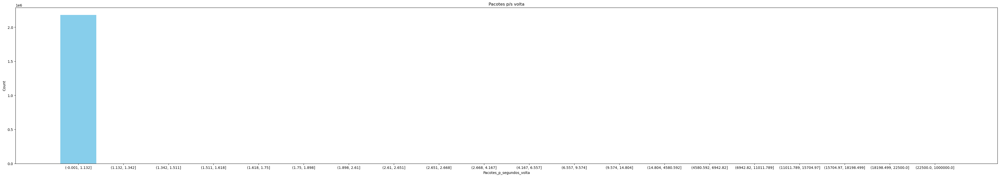

In [220]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[44], ("pacotes_p_segundo_volta","Count"), 1)
df_UDF

analytic_data_std(ddosFlow, columns[44], ("Pacotes_p_segundos_volta", "Count"), 20, 1, False, (50,8), "Pacotes p/s volta", 0)

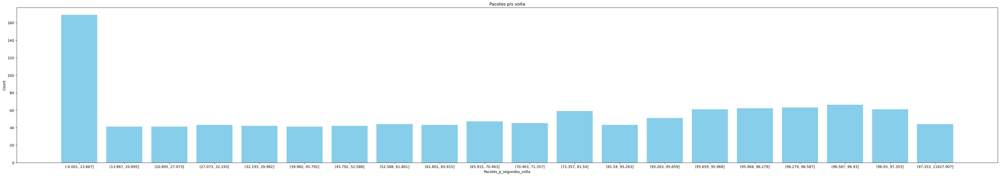

In [224]:
# DDoS Flow
df_UNF = get_df_unique(normalFlow, columns[44], ("pacotes_p_segundo_volta","Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[44], ("Pacotes_p_segundos_volta", "Count"), 20, 1, False, (50,8), "Pacotes p/s volta", 0)

In [225]:
# Gráfico da base completa 
df_final[columns[44]]

make_graph(3, df_final, columns[44], "Count", (20,6), "Pacotes p/s VOLTA", 0, 3000)

##### Comp. pacotes no fluxo

###### máximo

In [241]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[46], ("Comp_pacotes_fluxo_max", "Count"), 1)
df_UNF 

# analytic_data_std(normalFlow, columns[46], ("Comp_pacotes_fluxo_max","Count"), 20, 1, False, (40, 8), "Comp. pacotes no fluxo máximo (NF)", 0)

,Comp_pacotes_fluxo_max,Count
0,1.0,310
10,46.0,128
1,31.0,76
136,2860.0,25
21,59.0,24
...,...,...
109,918.0,1
53,110.0,1
111,1453.0,1
113,1493.0,1


In [165]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[46], ("Comp_pacotes_fluxo_max", "Count"), 1)
df_UDF 

# analytic_data_std(ddosFlow, columns[46], ("Comp_pacotes_fluxo_max","Count"), 20, 1, False, (40, 8), "Comp. pacotes no fluxo máximo (DF)", 0)

,Comp_pacotes_fluxo_max,Count
70,1472.0,1920323
69,1464.0,90111
64,1424.0,43886
67,1448.0,43149
57,1368.0,20475
...,...,...
5,84.0,6
4,68.0,6
6,100.0,2
12,777.0,1


In [167]:
# Gráfico da base completa 
df_final[columns[46]]

make_graph(3, df_final, columns[46], "Count", (20,6), "Comprimento máx pacotes no fluxo", 0, 3000)

###### mínimo

In [242]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[45], ("Comp_pacotes_fluxo_min", "Count"), 1)
df_UNF 

# analytic_data_std(normalFlow, columns[45], ("Comp_pacotes_fluxo_min","Count"), 20, 1, False, (40, 8), "Comp. pacotes no fluxo mínimo (NF)", 0)

,Comp_pacotes_fluxo_min,Count
0,0.0,670
7,31.0,56
19,43.0,44
8,32.0,32
21,45.0,30
9,33.0,26
2,25.0,24
11,35.0,24
18,42.0,23
23,47.0,18


In [243]:
normalFlow[normalFlow[columns[45]]==0][[columns[45], columns[1], columns[7], columns[11], columns[23], columns[9]]]

,Min Packet Length,Flow ID,Timestamp,Total Length of Fwd Packets,Flow IAT Mean,Total Fwd Packets
2389,0.0,192.168.50.6-23.194.142.213-57215-443-6,2018-12-01 11:22:40.970628,2.0,6913.333333,2
34745,0.0,192.168.50.8-125.56.201.105-59307-80-6,2018-12-01 11:22:49.599759,2.0,57962.666667,2
39961,0.0,192.168.50.6-23.194.142.213-57215-443-6,2018-12-01 11:22:51.002528,2.0,6862.000000,2
72983,0.0,192.168.50.8-125.56.201.105-59307-80-6,2018-12-01 11:22:59.786465,2.0,842479.250000,3
74291,0.0,172.217.12.129-192.168.50.8-443-59338-6,2018-12-01 11:23:00.129980,123.0,241.333333,4
...,...,...,...,...,...,...
2151048,0.0,172.217.12.129-192.168.50.7-443-51705-6,2018-12-01 11:32:23.929694,92.0,18702.800000,4
2151049,0.0,172.217.11.38-192.168.50.7-443-51710-6,2018-12-01 11:32:23.929816,92.0,15593.400000,4
2151050,0.0,172.217.11.34-192.168.50.7-443-51703-6,2018-12-01 11:32:23.929818,92.0,18677.800000,4
2151051,0.0,172.217.6.194-192.168.50.7-443-51708-6,2018-12-01 11:32:23.929884,92.0,18665.600000,4


In [169]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[45], ("Comp_pacotes_fluxo_min", "Count"), 1)
df_UDF 

# analytic_data_std(ddosFlow, columns[45], ("Comp_pacotes_fluxo_min","Count"), 20, 1, False, (40, 8), "Comp. pacotes no fluxo mínimo (DF)", 0)

,Comp_pacotes_fluxo_min,Count
65,1472.0,1920321
64,1464.0,90111
59,1424.0,43886
62,1448.0,43150
52,1368.0,20475
...,...,...
2,50.0,10
1,40.0,6
9,777.0,1
4,114.0,1


In [171]:
# Gráfico da base completa 
df_final[columns[45]]

make_graph(3, df_final, columns[45], "Count", (20,6), "Comprimento mínimo  pacotes no fluxo", 0, 3000)

###### médio

In [244]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[47], ("Comp_pacotes_fluxo_med", "Count"), 1)
df_UNF 

# analytic_data_std(normalFlow, columns[47], ("Comp_pacotes_fluxo_med","Count"), 20, 1, False, (40, 8), "Comp. pacotes no fluxo médio (NF)", 0)

,Comp_pacotes_fluxo_med,Count
1,0.600000,297
14,20.666667,58
26,32.857143,43
29,33.800000,30
33,37.400000,21
...,...,...
17,24.666667,1
12,18.500000,1
158,155.351852,1
11,15.500000,1


In [173]:
# DDOs Flow
df_UDF = get_df_unique(ddosFlow, columns[47], ("Comp_pacotes_fluxo_med", "Count"), 1)
df_UDF 

# analytic_data_std(ddosFlow, columns[48], ("Comp_pacotes_fluxo_med","Count"), 20, 1, False, (40, 8), "Comp. pacotes no fluxo médio (DF)", 0)

,Comp_pacotes_fluxo_med,Count
124,1472.000000,1920321
123,1464.000000,90111
116,1424.000000,43885
119,1448.000000,43149
109,1368.000000,20475
...,...,...
38,208.375000,1
22,106.865672,1
21,105.969231,1
52,287.333333,1


In [174]:
# Gráfico da base completa 
df_final[columns[47]]

make_graph(3, df_final, columns[47], "Count", (20,6), "Comprimento médio pacotes no fluxo", 0, 1000)

###### desvio padrao

In [175]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[48], ("Comp_pacotes_fluxo_desvio_padrao", "Count"), 0)
df_UNF 

# analytic_data_std(normalFlow, columns[48], ("Comp_pacotes_fluxo_desvio_padrao","Count"), 20, 1, False, (40, 8), "Comp. pacotes no fluxo desvio padrão (NF)", 0)

,Comp_pacotes_fluxo_desvio_padrao,Count
215,1255.979663,1
214,1237.172179,1
213,1189.726776,1
212,1180.872471,1
211,1079.261943,1
...,...,...
4,12.655697,1
3,11.538755,1
2,8.763561,125
1,0.547723,306


In [176]:
# DDos Flow
df_UDF = get_df_unique(ddosFlow, columns[48], ("Comp_pacotes_fluxo_desvio_padrao", "Count"), 0)
df_UDF 

# analytic_data_std(ddosFlow, columns[48], ("Comp_pacotes_fluxo_desvio_padrao","Count"), 20, 1, False, (40, 8), "Comp. pacotes no desvio padrão (DF)", 0)

,Comp_pacotes_fluxo_desvio_padrao,Count
60,452.306292,1
59,445.377208,1
58,444.012548,1
57,431.416894,1
56,430.773910,1
...,...,...
4,26.000000,1
3,25.373402,1
2,18.378732,1
1,13.145341,1


###### Variancia

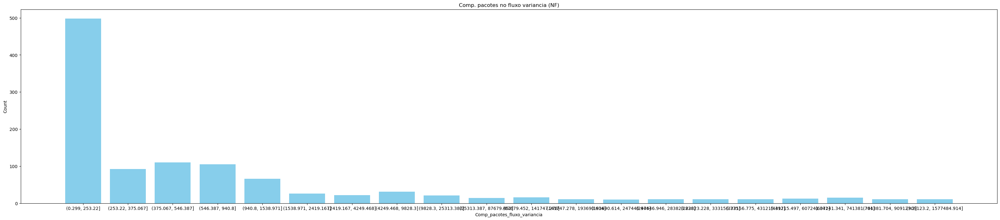

In [177]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[49], ("Comp_pacotes_fluxo_variancia", "Count"), 1)
df_UNF 

analytic_data_std(normalFlow, columns[49], ("Comp_pacotes_fluxo_variancia","Count"), 20, 1, False, (40, 8), "Comp. pacotes no fluxo variancia (NF)", 1)

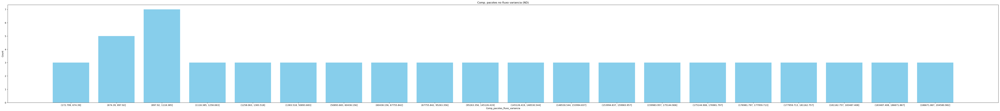

In [178]:
# DDos Flow
df_UDF = get_df_unique(ddosFlow, columns[49], ("Comp_pacotes_fluxo_variancia", "Count"), 1)
df_UDF 

analytic_data_std(ddosFlow, columns[49], ("Comp_pacotes_fluxo_variancia","Count"), 20, 1, False, (80, 8), "Comp. pacotes no fluxo variancia (ND)", 1)

##### Contagem

###### FIN (Finalize) - Tag do protocolo TCP indicada para o encerramento de um conexão

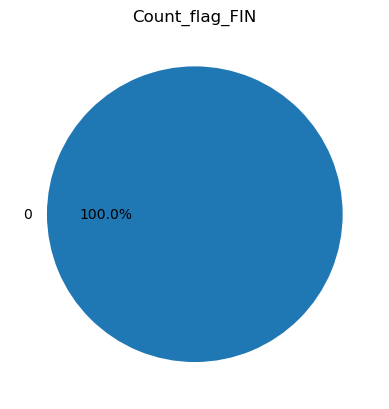

In [245]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[50], ("Count_flag_FIN", "Count"), 1)
df_UNF
make_graph(2, df_UNF, "Count_flag_FIN", "Count", (8,6), "Count_flag_FIN")

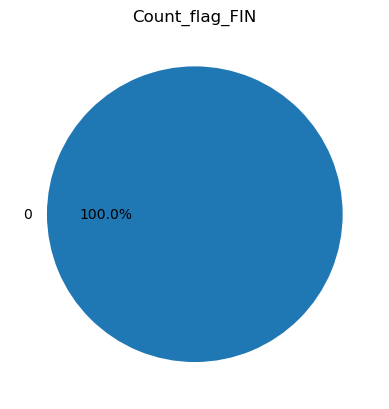

In [246]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[50], ("Count_flag_FIN", "Count"), 1)
df_UDF
make_graph(2, df_UDF, "Count_flag_FIN", "Count", (8,6), "Count_flag_FIN")

###### SYN (Synchronize) - Tag usada para o início de uma conexão TCP

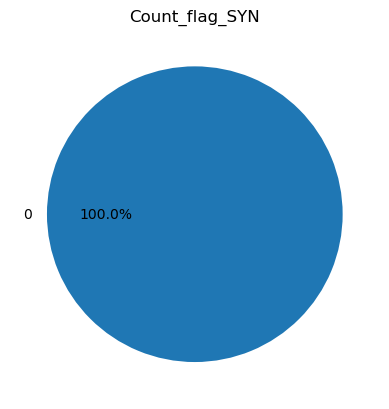

In [248]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[51], ("Count_flag_SYN", "Count"), 1)
df_UNF
make_graph(2, df_UNF, "Count_flag_SYN", "Count", (8,6), "Count_flag_SYN")

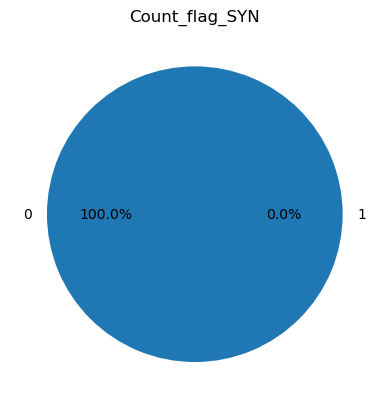

In [249]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[51], ("Count_flag_SYN", "Count"), 1)
df_UDF
make_graph(2, df_UDF, "Count_flag_SYN", "Count", (8,6), "Count_flag_SYN")


###### RST (Reset) - Usada para encerrar imediatamente uma conexão, pode indicar que algo deu errado


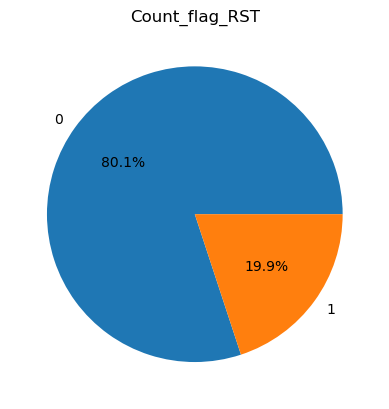

In [250]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[52], ("Count_flag_RST", "Count"), 1)
df_UNF

make_graph(2, df_UNF, "Count_flag_RST", "Count", (8,6), "Count_flag_RST")

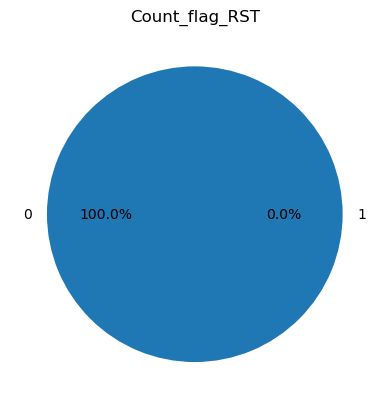

In [252]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[52], ("Count_flag_RST", "Count"), 1)
df_UDF
make_graph(2, df_UDF, "Count_flag_RST", "Count", (8,6), "Count_flag_RST")


###### PSH (Push) - Indica que o receptor deve entregar o pacote direto na camada de aplicação (sem esperar que o buffer esteja cheio)

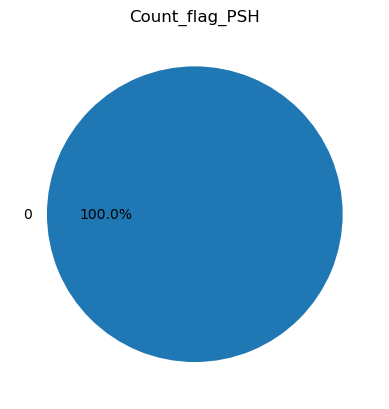

In [253]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[53], ("Count_flag_PSH", "Count"), 1)
df_UNF
make_graph(2, df_UNF, "Count_flag_PSH", "Count", (8,6), "Count_flag_PSH")

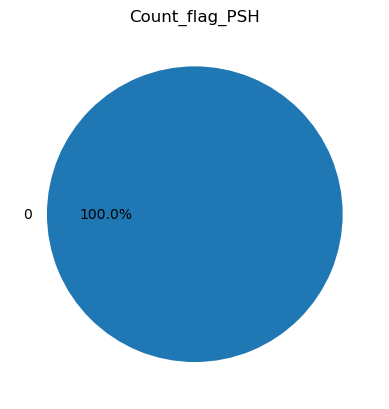

In [254]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[53], ("Count_flag_PSH", "Count"), 1)
df_UDF
make_graph(2, df_UDF, "Count_flag_PSH", "Count", (8,6), "Count_flag_PSH")

###### ACK (Acknowledgment) - Pacote que confirma o recebimento de outro pacote

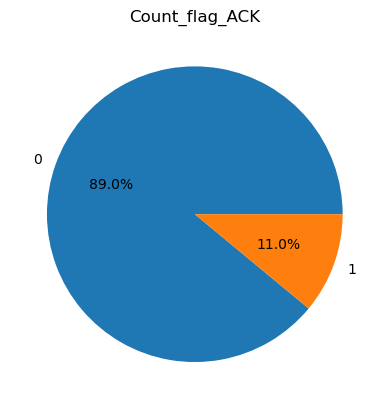

In [255]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[54], ("Count_flag_ACK", "Count"), 1)
df_UNF
make_graph(2, df_UNF, "Count_flag_ACK", "Count", (8,6), "Count_flag_ACK")

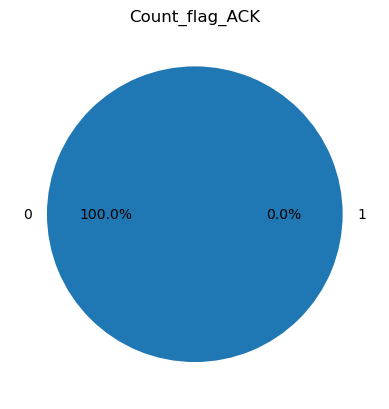

In [256]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[54], ("Count_flag_ACK", "Count"), 1)
df_UDF
make_graph(2, df_UDF, "Count_flag_ACK", "Count", (8,6), "Count_flag_ACK")

###### URG (Urgent) - Indica urgencia em relação aos dados do pacote e devem ter prioridade de processamento pelo receptor

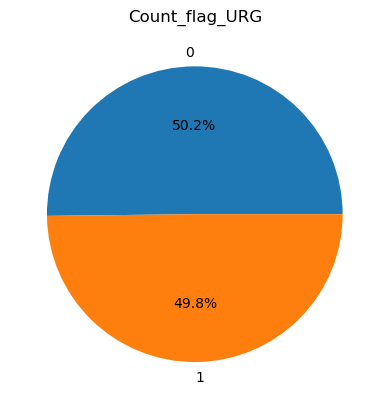

In [257]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[55], ("Count_flag_URG", "Count"), 1)
df_UNF
make_graph(2, df_UNF, "Count_flag_URG", "Count", (8,6), "Count_flag_URG")

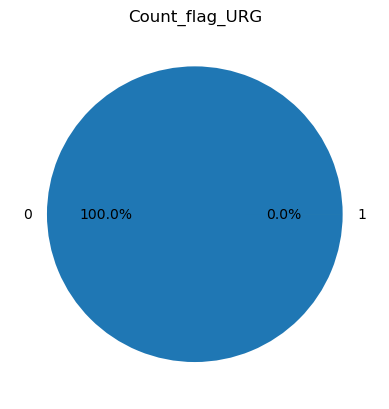

In [258]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[55], ("Count_flag_URG", "Count"), 1)
df_UDF
make_graph(2, df_UDF, "Count_flag_URG", "Count", (8,6), "Count_flag_URG")

###### CWE - se refere a fraquezas de um software

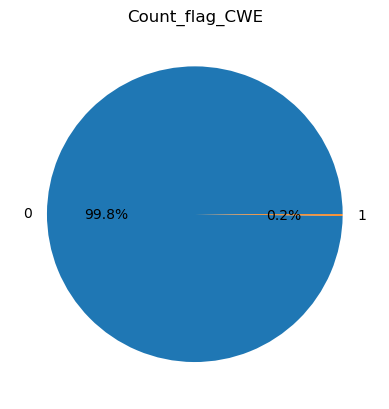

In [259]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[56], ("Count_flag_CWE", "Count"))
df_UNF
make_graph(2, df_UNF, "Count_flag_CWE", "Count", (8,6), "Count_flag_CWE")

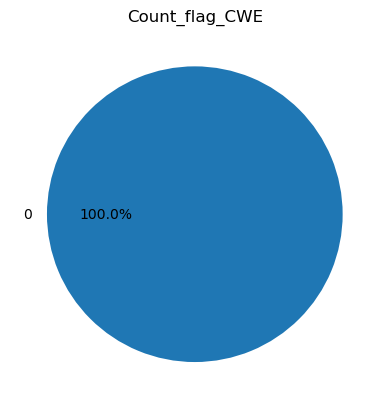

In [260]:
# DDos Flow
df_UDF = get_df_unique(ddosFlow, columns[56], ("Count_flag_CWE","Count"))
df_UDF
make_graph(2, df_UDF, "Count_flag_CWE", "Count", (8,6), "Count_flag_CWE")

###### ECE (Explicit Congestion Notification) - Indica que o dispositivo de origem é compatível com a notificação explícita de congestionamento

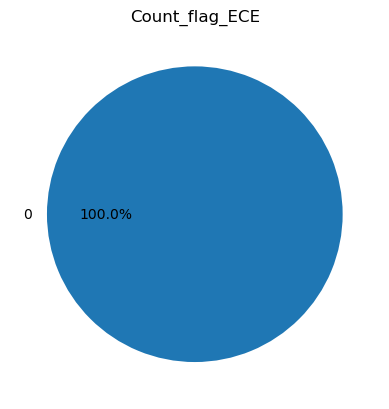

In [261]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[57], ("Count_flag_ECE","Count"))
df_UNF
make_graph(2, df_UNF, "Count_flag_ECE", "Count", (8,6), "Count_flag_ECE")

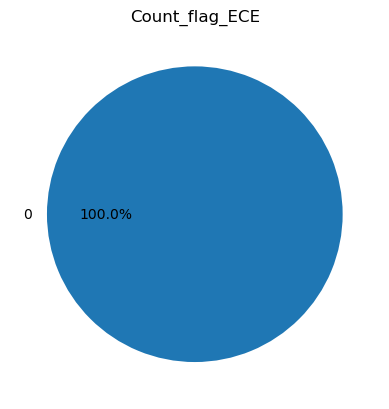

In [262]:
# DDos Flow
df_UDF = get_df_unique(ddosFlow, columns[57], ("Count_flag_ECE","Count"))
df_UDF
make_graph(2, df_UDF, "Count_flag_ECE", "Count", (8,6), "Count_flag_ECE")

##### Razao entre tráfego de download/upload

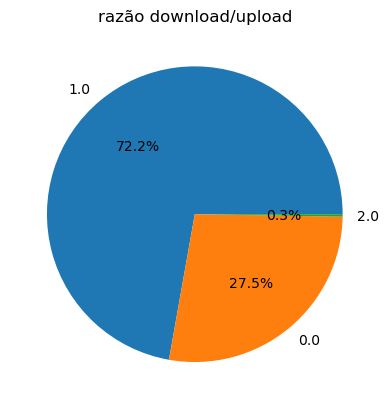

In [263]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[58], ("razao_down_up","Count"))
# df_UNF
make_graph(2, df_UNF, "razao_down_up", "Count", (8,6), "razão download/upload")

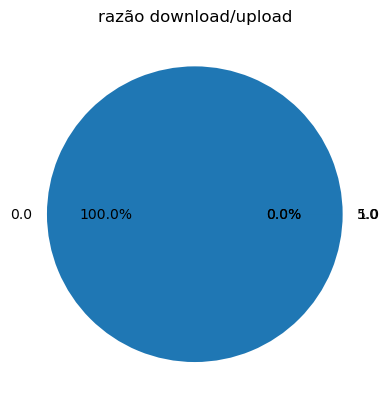

In [264]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[58], ("razao_down_up","Count"))
# df_UDF
make_graph(2, df_UDF, "razao_down_up", "Count", (8,6), "razão download/upload")

##### Tamanho do pacote

###### tamanho médio do pacote 

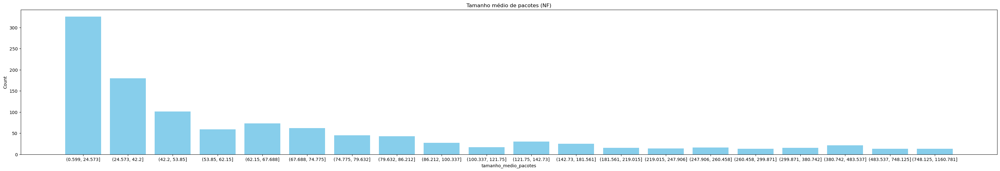

In [265]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[59], ("Tamanho_medio_pacotes","Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[59], ("tamanho_medio_pacotes","Count"), 20, 1, False, (40,6), "Tamanho médio de pacotes (NF)", 0)

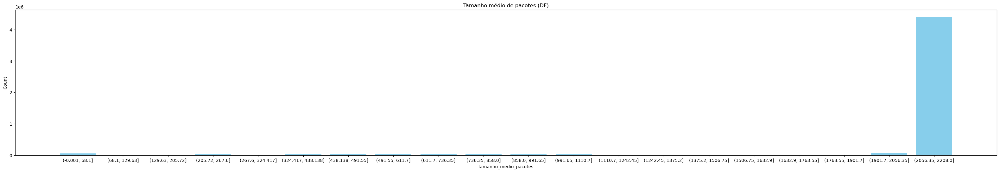

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[59], ("Tamanho_medio_pacotes","Count"), 1)
df_UDF

analytic_data_std(ddosFlow, columns[59], ("tamanho_medio_pacotes","Count"), 20, 1, False, (40,6), "Tamanho médio de pacotes (DF)", 0)

In [267]:
# Gráfico da base completa 
df_final[columns[59]]

make_graph(3, df_final, columns[59], "Count", (20,6), "Tamanho médio dos pacotes", 0, 3000)

###### tamanho médio seg. direção ida

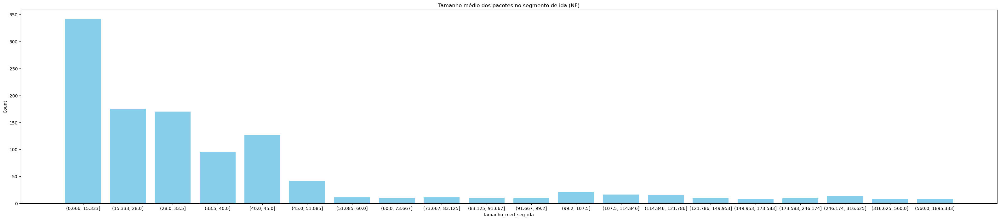

In [268]:
# Normal flow
df_UNF = get_df_unique(normalFlow, columns[60], ("tamanho_med_seg_ida","Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[60], ("tamanho_med_seg_ida","Count"), 20, 1, False, (40,8), "Tamanho médio dos pacotes no segmento de ida (NF)", 0)

In [136]:
# DDoS flow
df_UDF = get_df_unique(ddosFlow, columns[60], ("tamanho_med_seg_ida","Count"), 0)
df_UDF

# analytic_data_std(ddosFlow, columns[60], ("tamanho_med_seg_ida","Count"), 20, 1, False, (40,8), "Tamanho médio dos pacotes no segmento de ida (DF)", 0)

,tamanho_med_seg_ida,Count
1698,1472.0,3643128
1697,1471.0,15
1696,1470.0,65
1695,1469.0,18
1694,1468.0,12
...,...,...
4,4.2,1
3,4.0,2
2,3.0,3
1,2.0,1


In [274]:
# Gráfico da base completa 
make_graph(3, df_final, columns[60], "Count", (20,6), "Tamanho médio dos pacotes seg ida", 0, 3000)

###### tamanho médio seg. direção volta

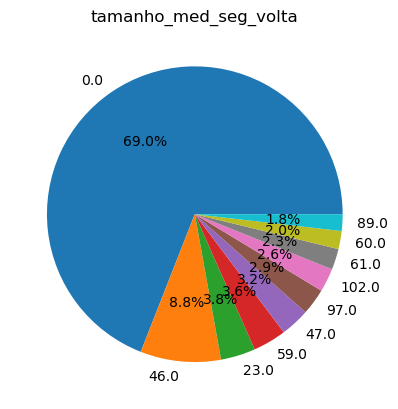

In [272]:
# Normal flow
df_UNF = get_df_unique(normalFlow, columns[61], ("tamanho_med_seg_volta","Count"), 1)
df_UNF

make_graph(2, df_UNF.iloc[0:10,:], "tamanho_med_seg_volta", "Count", (8,6), "tamanho_med_seg_volta")

# analytic_data_std(normalFlow, columns[61], ("tamanho_med_seg_volta","Count"), 20, 1, False, (40,8), "Tamanho médio dos pacotes no segmento de volta (NF)", 0)

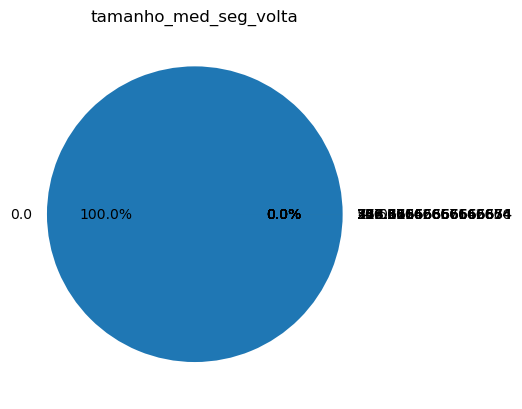

In [273]:
# DDoS
df_UDF = get_df_unique(ddosFlow, columns[61], ("tamanho_med_seg_volta","Count"), 1)
df_UDF

make_graph(2, df_UDF.iloc[0:10,:], "tamanho_med_seg_volta", "Count", (8,6), "tamanho_med_seg_volta")

# analytic_data_std(ddosFlow, columns[61], ("tamanho_med_seg_volta","Count"), 20, 1, False, (40,8), "Tamanho médio dos pacotes no segmento de volta (DF)", 0)

In [271]:
# Gráfico da base completa 
make_graph(3, df_final, columns[61], "Count", (20,6), "Tamanho médio dos pacotes seg volta", 0, 3000)

##### Média de bytes por bulk

###### ida

In [275]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[63], ("media_bytes_p_bulk", "Count"), 1)
df_UNF

,media_bytes_p_bulk,Count
0,0,1108


In [276]:
# Normal Flow
df_UDF = get_df_unique(ddosFlow, columns[63], ("media_bytes_p_bulk", "Count"), 1)
df_UDF

,media_bytes_p_bulk,Count
0,0,2140933


###### volta

In [277]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[66], ("media_bytes_p_bulk", "Count"), 1)
df_UNF

,media_bytes_p_bulk,Count
0,0,1108


In [278]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[66], ("media_bytes_p_bulk", "Count"), 1)
df_UDF

,media_bytes_p_bulk,Count
0,0,2140933


##### Media de pacotes por bulk

###### ida

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[64], ("media_pacotes_p_bulk", "Count"), 1)
df_UNF

,media_pacotes_p_bulk,Count
0,0,3354


In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[64], ("media_pacotes_p_bulk", "Count"), 1)
df_UDF

,media_bytes_p_bulk,Count
0,0,4908665


###### volta

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[67], ("media_pacotes_p_bulk", "Count"), 1)
df_UNF

,media_pacotes_p_bulk,Count
0,0,3354


In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[67], ("media_pacotes_p_bulk", "Count"), 1)
df_UDF

,media_pacotes_p_bulk,Count
0,0,4908665


##### Taxa média de quantidade de bulks

###### ida

In [279]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[64], ("taxa_media_de_bulks", "Count"), 1)
df_UNF

,taxa_media_de_bulks,Count
0,0,1108


In [ ]:
# DDoS Flow
df_UNF = get_df_unique(ddosFlow, columns[64], ("taxa_media_de_bulks", "Count"), 1)
df_UNF

,taxa_media_de_bulks,Count
0,0,4908665


###### volta

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[68], ("taxa_media_de_bulks", "Count"), 1)
df_UNF

,taxa_media_de_bulks,Count
0,0,3354


In [ ]:
# DDoS Flow
df_UNF = get_df_unique(ddosFlow, columns[68], ("taxa_media_de_bulks", "Count"), 1)
df_UNF

,taxa_media_de_bulks,Count
0,0,4908665


##### Subfluxo

##### Número de pacotes no subfluxo

###### Ida

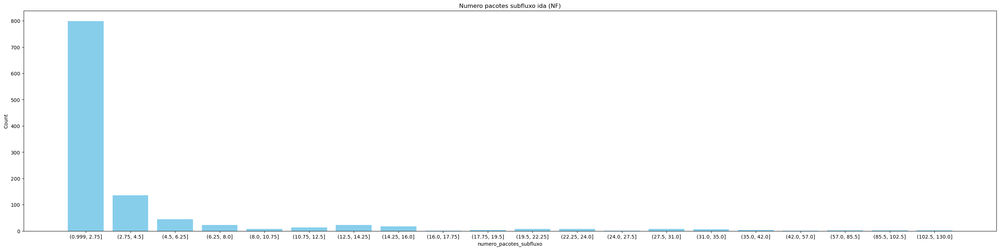

In [280]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[69], ("numero_pacotes_subfluxo","Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[69], ("numero_pacotes_subfluxo","Count"), 20, 1, False, (35,8), "Numero pacotes subfluxo ida (NF)")

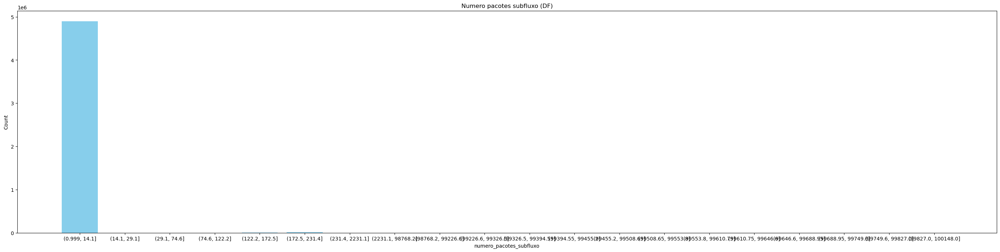

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[69], ("numero_pacotes_subfluxo","Count"), 1)
df_UDF

analytic_data_std(ddosFlow, columns[69], ("numero_pacotes_subfluxo","Count"), 20, 1, False, (35,8), "Numero pacotes subfluxo ida (DF)", 0)

In [281]:
# Gráfico da base completa
make_graph(3, df_final, columns[69], "Count", (20,6), "Numero pacotes subfluxo ida (DF)", 0, 3000)


###### volta

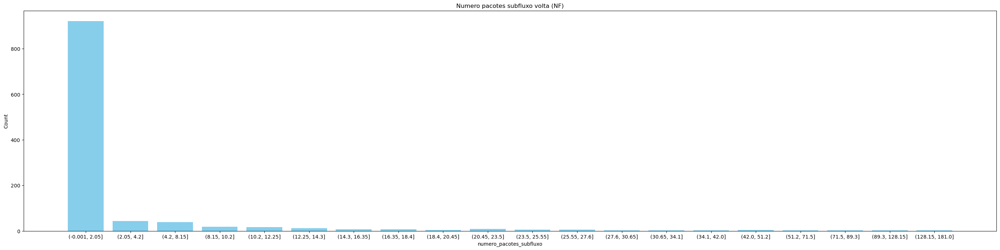

In [284]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[71], ("numero_pacotes_subfluxo","Count"), 1)º
df_UNF

analytic_data_std(normalFlow, columns[71], ("numero_pacotes_subfluxo","Count"), 20, 1, False, (35,8), "Numero pacotes subfluxo volta (NF)", 0)

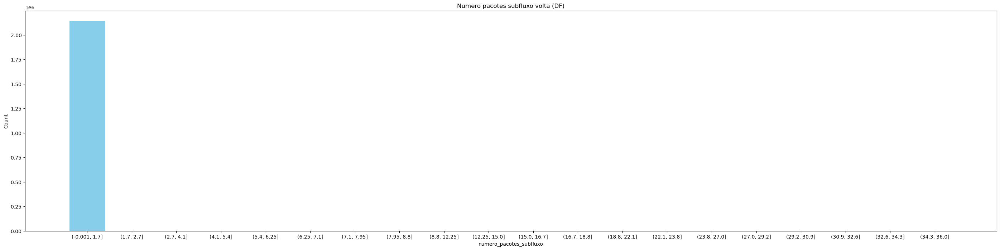

In [285]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[71], ("numero_pacotes_subfluxo","Count"), 1)
df_UDF

analytic_data_std(ddosFlow, columns[71], ("numero_pacotes_subfluxo","Count"), 20, 1, False, (35,8), "Numero pacotes subfluxo volta (DF)", 0)


In [287]:
# Gráfico da base completa
make_graph(3, df_final, columns[71], "Count", (20,6), "Numero pacotes subfluxo volta (DF)", 0, 3000)

##### Bytes do subfluxo

###### ida

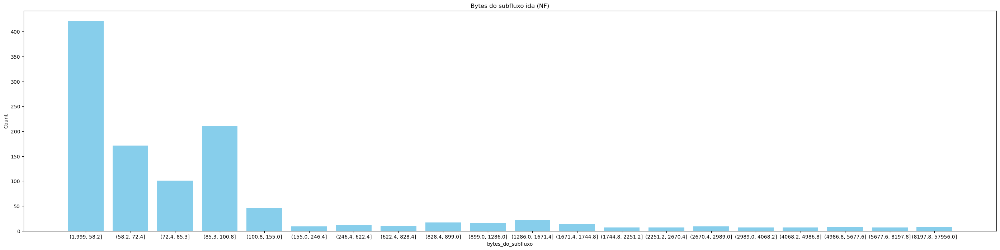

In [288]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[70], ("bytes_do_subfluxo","Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[70], ("bytes_do_subfluxo","Count"), 20, 1, False, (35,8), "Bytes do subfluxo ida (NF)", 0)

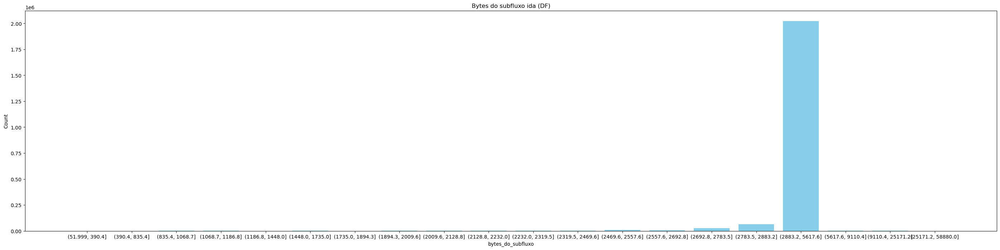

In [289]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[70], ("bytes_do_subfluxo","Count"), 1)
df_UDF

analytic_data_std(ddosFlow, columns[70], ("bytes_do_subfluxo","Count"), 20, 1, False, (35,8), "Bytes do subfluxo ida (DF)", 0)

In [290]:
# Gráfico da base completa
make_graph(3, df_final, columns[70], "Count", (20,6), "Numero pacotes subfluxo ida (DF)", 0, 3000)

###### volta

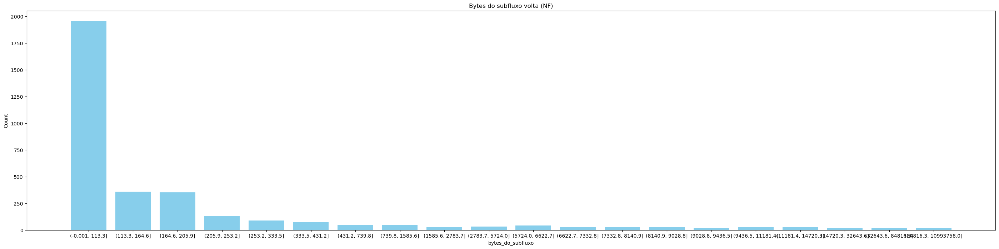

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[72], ("bytes_do_subfluxo","Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[72], ("bytes_do_subfluxo","Count"), 20, 1, False, (35,8), "Bytes do subfluxo volta (NF)", 0)

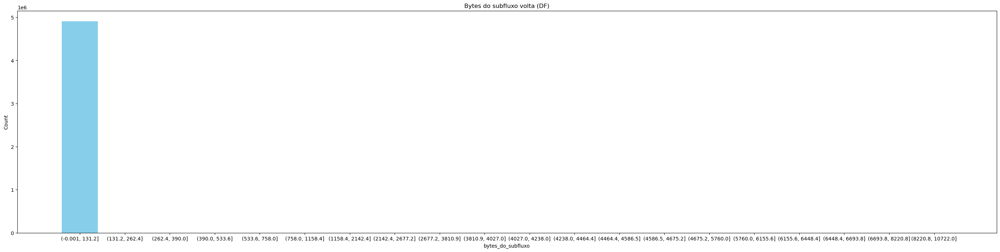

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[72], ("bytes_do_subfluxo","Count"), 1)
df_UDF

analytic_data_std(ddosFlow, columns[72], ("bytes_do_subfluxo","Count"), 20, 1, False, (35,8), "Bytes do subfluxo volta (DF)", 0)

In [292]:
# Gráfico da base completa
make_graph(3, df_final, columns[72], "Count", (20,6), "Numero pacotes subfluxo ida (DF)", 0, 3000)

##### Tamanho da Janela inicial

###### Ida

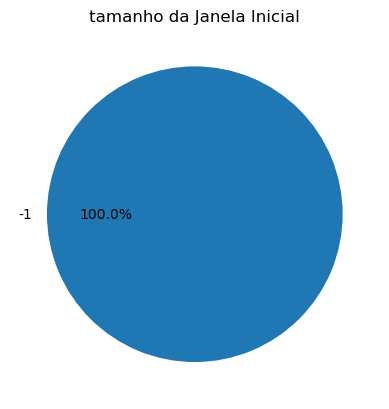

In [293]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[73], ("tamanho_da_janela_inicial","Count"), 1)
df_UNF

make_graph(2, df_UNF, "tamanho_da_janela_inicial", "Count", (8,6), "tamanho da Janela Inicial")

# analytic_data_std(normalFlow, columns[73], ("tamanho_da_janela_inicial","Count"), 20, 1, False, (35,8), "Tamanho da janela inicial ida (NF)", 0)

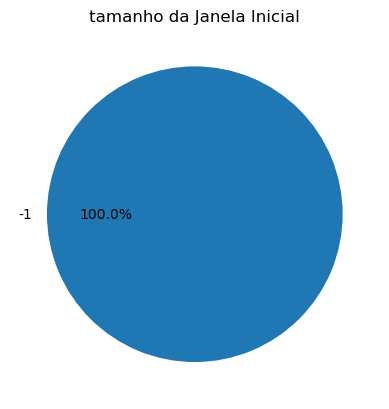

In [298]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[73], ("tamanho_da_janela_inicial","Count"), 1)
df_UDF


make_graph(2, df_UDF, "tamanho_da_janela_inicial", "Count", (8,6), "tamanho da Janela Inicial")

# analytic_data_std(ddosFlow, columns[73], ("tamanho_da_janela_inicial","Count"), 20, 1, False, (35,8), "tamanho da Janela Inicial ida (DF)", 0)

###### volta

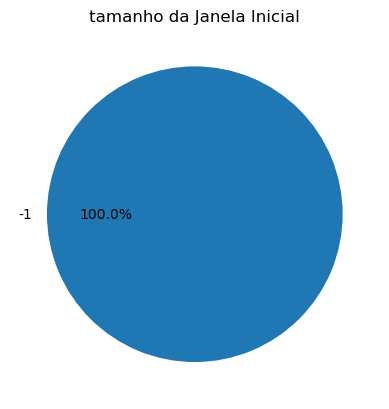

In [299]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[74], ("tamanho_da_janela_inicial","Count"), 1)
df_UNF

make_graph(2, df_UNF, "tamanho_da_janela_inicial", "Count", (8,6), "tamanho da Janela Inicial")

# analytic_data_std(normalFlow, columns[74], ("tamanho_da_janela_inicial","Count"), 20, 1, False, (35,8), "Tamanho da janela inicial volta (NF)", 0)

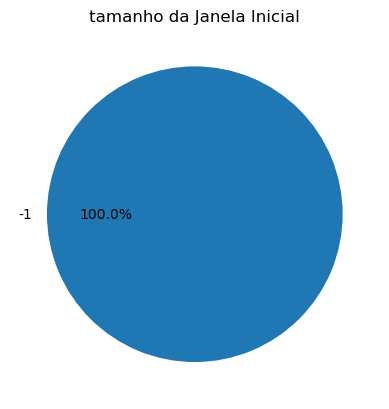

In [300]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[74], ("tamanho_da_janela_inicial","Count"), 1)
df_UDF

make_graph(2, df_UDF, "tamanho_da_janela_inicial", "Count", (8,6), "tamanho da Janela Inicial")

# analytic_data_std(ddosFlow, columns[74], ("tamanho_da_janela_inicial","Count"), 20, 1, False, (35,8), "Tamanho da Janela Inicial volta (DF)", 0)

##### Pacotes de dados ativos na direção de ida

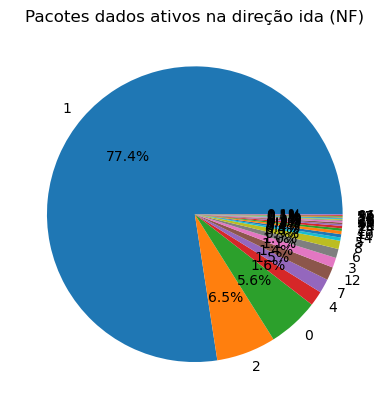

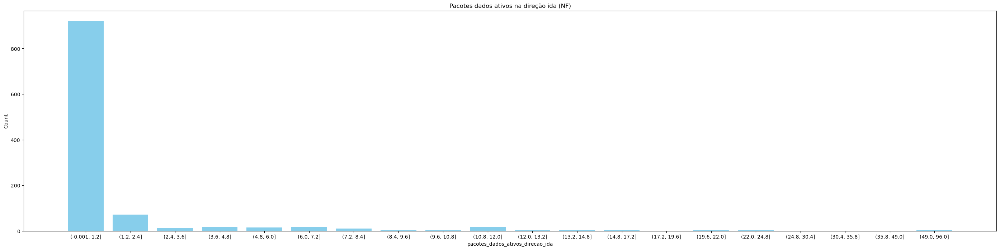

In [312]:
# Normal flow

df_UNF = get_df_unique(normalFlow, columns[75], ("pacotes_dados_ativos_direcao_ida","Count"), 1)
df_UNF

make_graph(2, df_UNF, "pacotes_dados_ativos_direcao_ida", "Count", (8,6), "Pacotes dados ativos na direção ida (NF)")

analytic_data_std(normalFlow, columns[75], ("pacotes_dados_ativos_direcao_ida","Count"), 20, 1, False, (35,8), "Pacotes dados ativos na direção ida (NF)", 0)

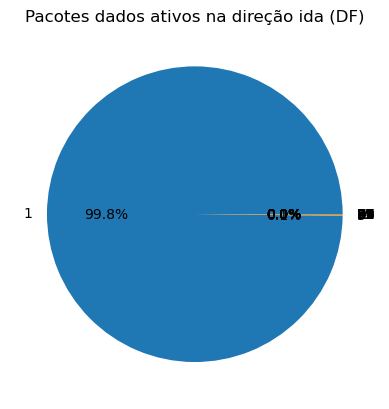

In [313]:
# Ddos flow

df_UDF = get_df_unique(ddosFlow, columns[75], ("pacotes_dados_ativos_direcao_ida","Count"), 1)
df_UDF

make_graph(2, df_UDF, "pacotes_dados_ativos_direcao_ida", "Count", (8,6), "Pacotes dados ativos na direção ida (DF)")

# analytic_data_std(ddosFlow, columns[75], ("pacotes_dados_ativos_direcao_ida","Count"), 20, 1, False, (35,8), "Pacotes dados ativos na direção ida (DF)", 0)

In [314]:
# Gráfico da base completa
make_graph(3, df_final, columns[75], "Count", (20,6), "Pacotes dados ativos na direção ida (NF)", 0, 3000)

##### Tamanho mínimo do segmento na direção de ida

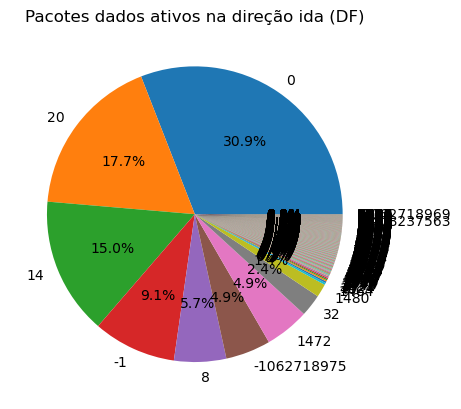

In [316]:
# DDoS flow

df_UDF = get_df_unique(ddosFlow, columns[76], ("pacotes_dados_ativos_direcao_ida","Count"), 1)
df_UDF

make_graph(2, df_UDF, "pacotes_dados_ativos_direcao_ida", "Count", (8,6), "Pacotes dados ativos na direção ida (DF)")

# analytic_data_std(ddosFlow, columns[75], ("pacotes_dados_ativos_direcao_ida","Count"), 20, 1, False, (35,8), "Pacotes dados ativos na direção ida (NF)", 0)

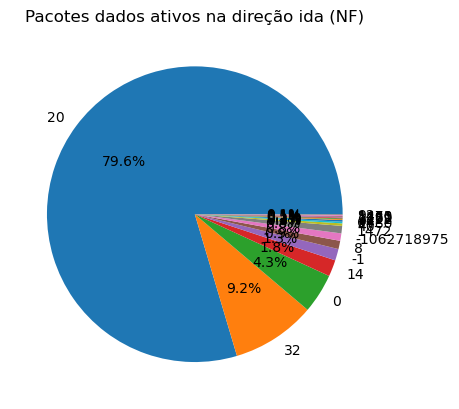

In [315]:
# normal flow

df_UNF = get_df_unique(normalFlow, columns[76], ("pacotes_dados_ativos_direcao_ida","Count"), 1)
df_UNF

make_graph(2, df_UNF, "pacotes_dados_ativos_direcao_ida", "Count", (8,6), "Pacotes dados ativos na direção ida (NF)")


In [305]:
# Gráfico da base completa
make_graph(3, df_final, columns[75], "Count", (20,6), "Pacotes dados ativos na direção ida (NF)", 0, 3000)

##### Tamanho mínimo do segmentos na direção de ida

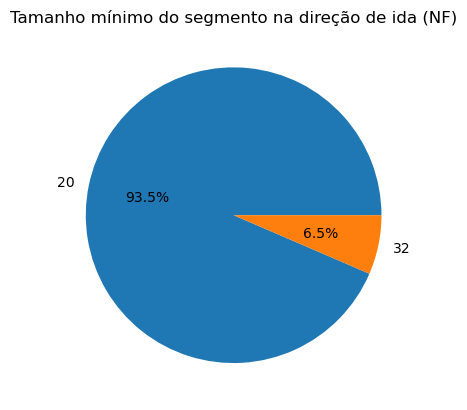

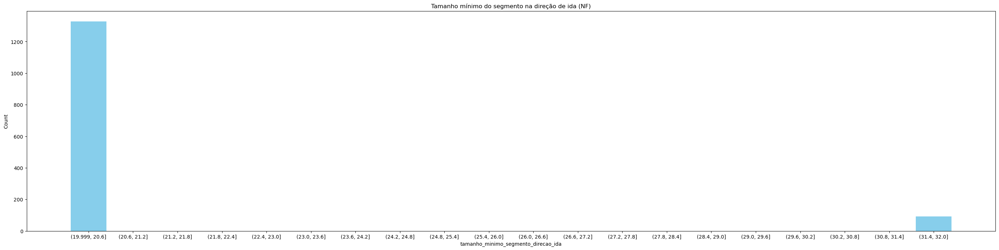

In [ ]:
# Normal flow

df_UNF = get_df_unique(normalFlow, columns[76], ("tamanho_minimo_segmento_direcao_ida","Count"), 1)
df_UNF

make_graph(2, df_UNF, "tamanho_minimo_segmento_direcao_ida", "Count", (8,6), "Tamanho mínimo do segmento na direção de ida (NF)")

analytic_data_std(normalFlow, columns[76], ("tamanho_minimo_segmento_direcao_ida","Count"), 20, 1, False, (35,8), "Tamanho mínimo do segmento na direção de ida (NF)", 0)

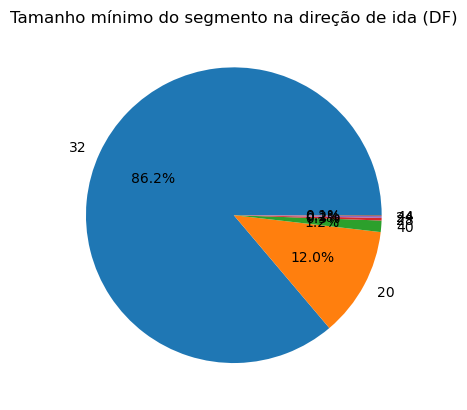

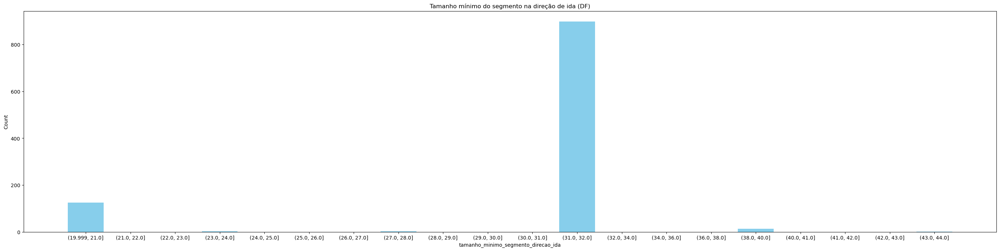

In [ ]:
# DDoS flow

df_UDF = get_df_unique(ddosFlow, columns[76], ("tamanho_minimo_segmento_direcao_ida","Count"), 1)
df_UDF

make_graph(2, df_UDF, "tamanho_minimo_segmento_direcao_ida", "Count", (8,6), "Tamanho mínimo do segmento na direção de ida (DF)")

analytic_data_std(ddosFlow, columns[76], ("tamanho_minimo_segmento_direcao_ida","Count"), 20, 1, False, (35,8), "Tamanho mínimo do segmento na direção de ida (DF)", 0)

##### Tempo de atividade

###### Médio

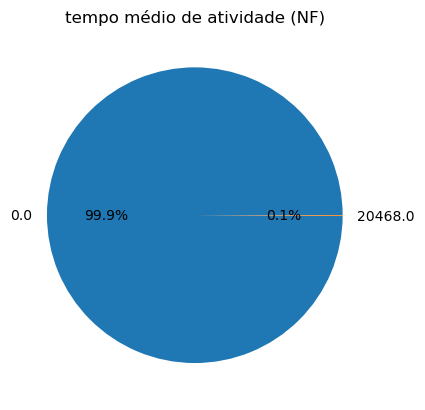

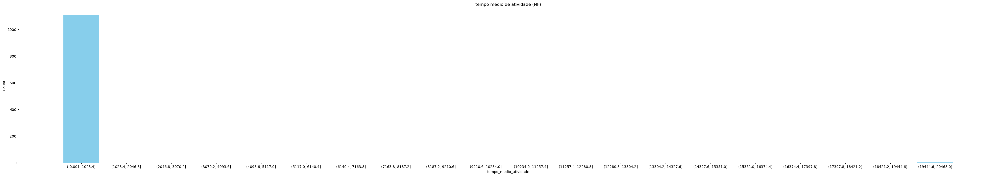

In [317]:
# Normal flow

df_UNF = get_df_unique(normalFlow, columns[77], ("tempo_medio_atividade","Count"), 1)
df_UNF

make_graph(2, df_UNF, "tempo_medio_atividade", "Count", (8,6), "tempo médio de atividade (NF)")

analytic_data_std(normalFlow, columns[77], ("tempo_medio_atividade","Count"), 20, 1, False, (50,8), "tempo médio de atividade (NF)", 0)

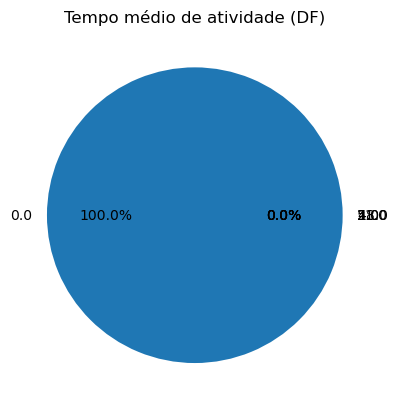

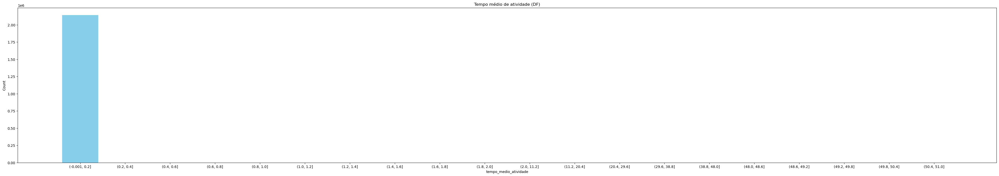

In [318]:
# DDos flow

df_UDF = get_df_unique(ddosFlow, columns[77], ("tempo_medio_atividade","Count"), 1)
df_UDF

make_graph(2, df_UDF, "tempo_medio_atividade", "Count", (8,6), "Tempo médio de atividade (DF)")

analytic_data_std(ddosFlow, columns[77], ("tempo_medio_atividade","Count"), 20, 1, False, (50,8), "Tempo médio de atividade (DF)", 0)

In [342]:
# Gráfico da base completa
make_graph(3, df_final, columns[77], "Count", (20,6), "Tempo médio de atividade", 0, 3000)

###### Desvio padrão

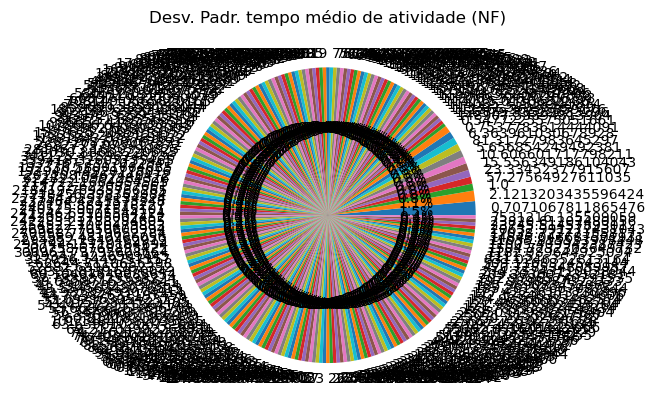

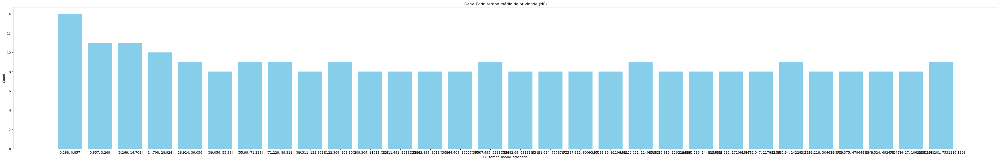

In [ ]:
# Normal flow
df_UNF = get_df_unique(normalFlow, columns[78], ("DP_tempo_medio_atividade","Count"), 1)
df_UNF

make_graph(2, df_UNF.iloc[1:, :], "DP_tempo_medio_atividade", "Count", (8,6), "Desv. Padr. tempo médio de atividade (NF)")

analytic_data_std(normalFlow, columns[78], ("DP_tempo_medio_atividade","Count"), 30, 1, False, (55,8), "Desv. Padr. tempo médio de atividade (NF)", 1)

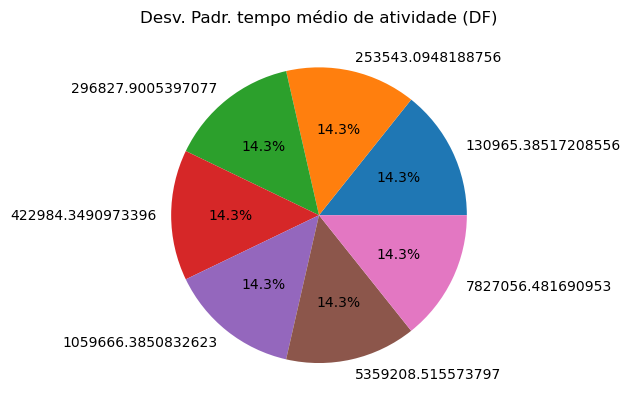

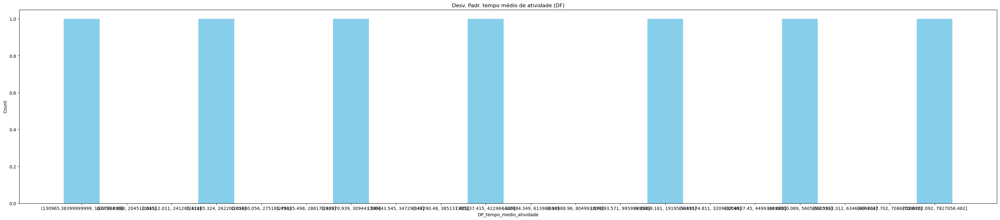

In [ ]:
# DDoS flow
df_UDF = get_df_unique(ddosFlow, columns[78], ("DP_tempo_medio_atividade","Count"), 1)
df_UDF

make_graph(2, df_UDF.iloc[1:, :], "DP_tempo_medio_atividade", "Count", (8,6), "Desv. Padr. tempo médio de atividade (DF)")

analytic_data_std(ddosFlow, columns[78], ("DP_tempo_medio_atividade","Count"), 20, 1, False, (40,8), "Desv. Padr. tempo médio de atividade (DF)", 1)

###### máximo

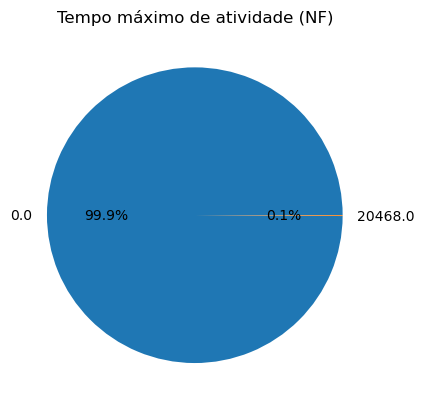

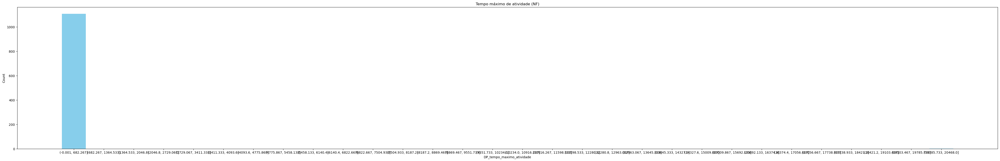

In [348]:
# Normal flow
df_UNF = get_df_unique(normalFlow, columns[79], ("DP_tempo_maximo_atividade","Count"), 1)
df_UNF

make_graph(2, df_UNF, "DP_tempo_maximo_atividade", "Count", (8,6), "Tempo máximo de atividade (NF)")

analytic_data_std(normalFlow, columns[79], ("DP_tempo_maximo_atividade","Count"), 30, 1, False, (55,8), "Tempo máximo de atividade (NF)", 0)

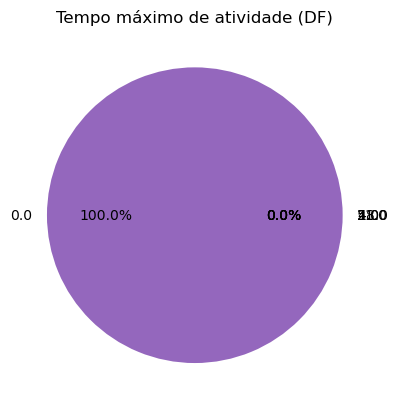

In [344]:
# DDoS flow
df_UDF = get_df_unique(ddosFlow, columns[79], ("DP_tempo_maximo_atividade","Count"), 0)
df_UDF

make_graph(2, df_UDF, "DP_tempo_maximo_atividade", "Count", (8,6), "Tempo máximo de atividade (DF)")

# analytic_data_std(ddosFlow, columns[79], ("DP_tempo_maximo_atividade","Count"), 30, 1, False, (55,8), "Tempo máximo de atividade (DF)", 1)

In [346]:
# Gráfico da base completa
make_graph(3, df_final, columns[79], "Count", (20,6), "Tempo máximo de atividade", 0, 3000)

###### mínimo

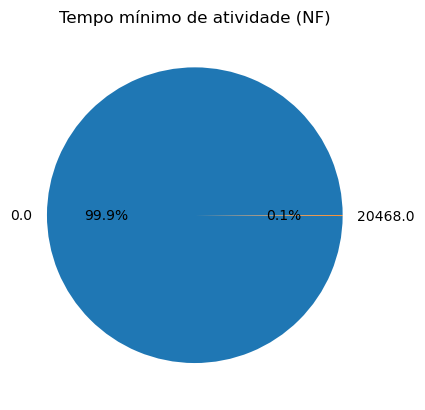

In [353]:
# Normal flow
df_UNF = get_df_unique(normalFlow, columns[80], ("DP_tempo_minimo_atividade","Count"), 1)
df_UNF

make_graph(2, df_UNF, "DP_tempo_minimo_atividade", "Count", (8,6), "Tempo mínimo de atividade (NF)")

# analytic_data_std(normalFlow, columns[80], ("DP_tempo_minimo_atividade","Count"), 30, 1, False, (55,8), "Tempo mínimo de atividade (NF)", 0)

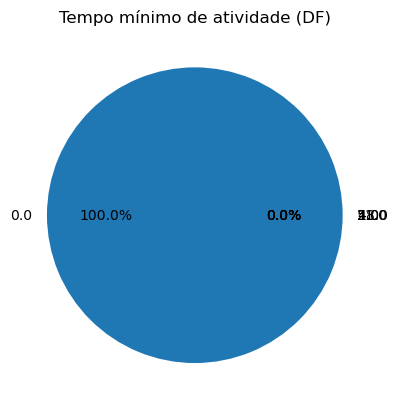

In [352]:
# DDoS flow
df_UDF = get_df_unique(ddosFlow, columns[80], ("DP_tempo_minimo_atividade","Count"), 1)
df_UDF

make_graph(2, df_UDF, "DP_tempo_minimo_atividade", "Count", (8,6), "Tempo mínimo de atividade (DF)")

# analytic_data_std(ddosFlow, columns[80], ("DP_tempo_minimo_atividade","Count"), 30, 1, False, (55,8), "Tempo mínimo de atividade (DF)", 1)

In [354]:
# Gráfico da base completa
make_graph(3, df_final, columns[80], "Count", (20,6), "Tempo mínimo de atividade", 0, 3000)

###### Verificar tempo de atividade dividido pelo IP

In [ ]:
max =  normalFlow.groupby(columns[1])[columns[80]].max().reset_index()
max[max.iloc[:, 1] > 0]

,Flow ID,Active Min
1,162.248.19.151-192.168.50.6-443-57056-6,28392.0
2,162.248.19.151-192.168.50.6-443-57057-6,28286.0
3,162.248.19.151-192.168.50.6-443-57115-6,143295.0
5,172.217.0.102-192.168.50.8-443-59144-6,233587.0
6,172.217.0.102-192.168.50.8-443-59146-6,254508.0
...,...,...
1621,192.168.50.8-74.208.236.171-59223-80-6,411895.0
1676,192.168.50.8-96.6.27.46-59153-443-6,28828.0
1677,192.168.50.8-96.6.27.46-59154-443-6,28836.0
1683,255.255.255.255-0.0.0.0-67-68-17,5982561.0


In [ ]:
min =  normalFlow.groupby(columns[1])[columns[79]].max().reset_index()
min[min.iloc[:, 1] > 0]

,Flow ID,Active Max
1,162.248.19.151-192.168.50.6-443-57056-6,155485.0
2,162.248.19.151-192.168.50.6-443-57057-6,145601.0
3,162.248.19.151-192.168.50.6-443-57115-6,143295.0
5,172.217.0.102-192.168.50.8-443-59144-6,233668.0
6,172.217.0.102-192.168.50.8-443-59146-6,254771.0
...,...,...
1621,192.168.50.8-74.208.236.171-59223-80-6,411895.0
1676,192.168.50.8-96.6.27.46-59153-443-6,244626.0
1677,192.168.50.8-96.6.27.46-59154-443-6,5163615.0
1683,255.255.255.255-0.0.0.0-67-68-17,12801591.0


In [ ]:
med =  normalFlow.groupby(columns[1])[columns[77]].max().reset_index()
med[med.iloc[:, 1] > 0] 

,Flow ID,Active Mean
1,162.248.19.151-192.168.50.6-443-57056-6,4.429175e+04
2,162.248.19.151-192.168.50.6-443-57057-6,4.298125e+04
3,162.248.19.151-192.168.50.6-443-57115-6,1.432950e+05
5,172.217.0.102-192.168.50.8-443-59144-6,2.336275e+05
6,172.217.0.102-192.168.50.8-443-59146-6,2.546395e+05
...,...,...
1621,192.168.50.8-74.208.236.171-59223-80-6,4.118950e+05
1676,192.168.50.8-96.6.27.46-59153-443-6,8.245225e+04
1677,192.168.50.8-96.6.27.46-59154-443-6,5.347922e+05
1683,255.255.255.255-0.0.0.0-67-68-17,9.218128e+06


In [ ]:
verify = normalFlow[normalFlow[columns[1]] == "162.248.19.151-192.168.50.6-443-57056-6"]
verify[[columns[1],columns[77], columns[7]]]

,Flow ID,Active Mean,Timestamp
10771,162.248.19.151-192.168.50.6-443-57056-6,44291.75,2018-12-01 10:59:04.113123
12877,162.248.19.151-192.168.50.6-443-57056-6,28471.00,2018-12-01 11:00:34.493232
13441,162.248.19.151-192.168.50.6-443-57056-6,0.00,2018-12-01 11:00:59.761421
13449,162.248.19.151-192.168.50.6-443-57056-6,0.00,2018-12-01 11:00:59.789900
13450,162.248.19.151-192.168.50.6-443-57056-6,0.00,2018-12-01 11:00:59.789904
13463,162.248.19.151-192.168.50.6-443-57056-6,0.00,2018-12-01 11:01:00.289547


##### Tempo de inatividade

###### Máximo

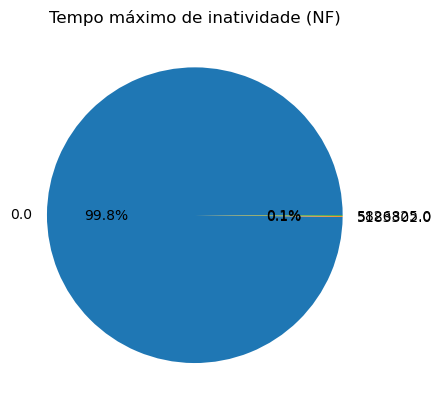

In [324]:
# NormalFlow flow
df_UNF = get_df_unique(normalFlow, columns[83], ("tempo_maximo_inatividade","Count"), 1)
df_UNF

make_graph(2, df_UNF, "tempo_maximo_inatividade", "Count", (8,6), "Tempo máximo de inatividade (NF)")

# analytic_data_std(normalFlow, columns[83], ("tempo_maximo_inatividade","Count"), 30, 1, False, (55,8), "Tempo máximo de inatividade (NF)", 1)

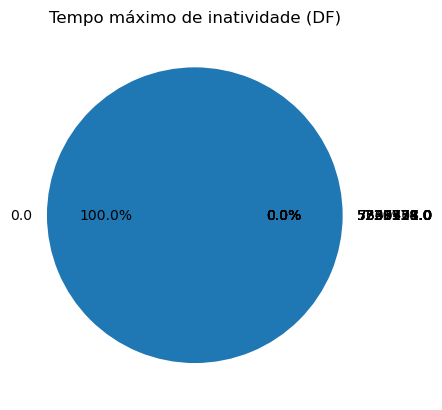

In [325]:
# DDoS flow
df_UDF = get_df_unique(ddosFlow, columns[83], ("tempo_maximo_inatividade","Count"), 1)
df_UDF

make_graph(2, df_UDF, "tempo_maximo_inatividade", "Count", (8,6), "Tempo máximo de inatividade (DF)")

# analytic_data_std(ddosFlow, columns[83], ("tempo_maximo_inatividade","Count"), 30, 1, False, (55,8), "Tempo máximo de inatividade (DFA)", 1)

In [327]:
# Gráfico da base completa
make_graph(3, df_final, columns[83], "Count", (20,6), "Tempo máximo de inatividade", 0, 3000)

###### Médio

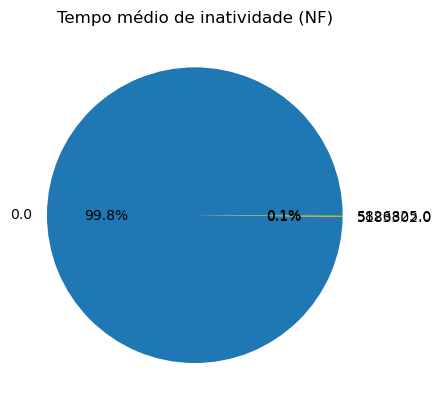

In [332]:
# NormalFlow flow
df_UNF = get_df_unique(normalFlow, columns[81], ("tempo_medio_inatividade","Count"), 1)
df_UNF

make_graph(2, df_UNF, "tempo_medio_inatividade", "Count", (8,6), "Tempo médio de inatividade (NF)")

# analytic_data_std(normalFlow, columns[81], ("tempo_medio_inatividade","Count"), 30, 1, False, (55,8), "Tempo médio de inatividade (NF)", 1)

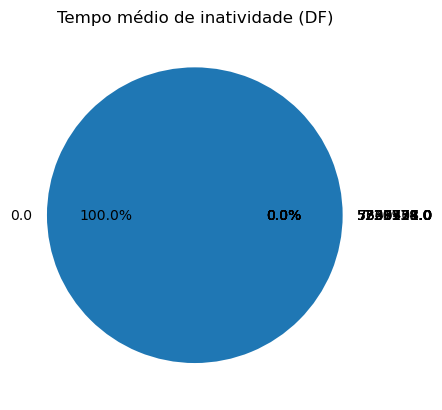

In [333]:
# DDoS flow
df_UDF = get_df_unique(ddosFlow, columns[81], ("tempo_medio_inatividade","Count"), 1)
df_UDF

make_graph(2, df_UDF, "tempo_medio_inatividade", "Count", (8,6), "Tempo médio de inatividade (DF)")

# analytic_data_std(ddosFlow, columns[81], ("tempo_medio_inatividade","Count"), 30, 1, False, (55,8), "Tempo médio de inatividade (DFA)", 1)

In [334]:
# Gráfico da base completa
make_graph(3, df_final, columns[83], "Count", (20,6), "Tempo médio de inatividade", 0, 3000)

###### Mínimo

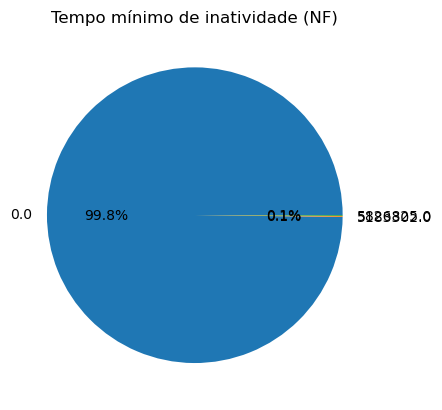

In [336]:
# NormalFlow flow
df_UNF = get_df_unique(normalFlow, columns[84], ("tempo_minimo_inatividade","Count"), 1)
df_UNF

make_graph(2, df_UNF, "tempo_minimo_inatividade", "Count", (8,6), "Tempo mínimo de inatividade (NF)")

# analytic_data_std(normalFlow, columns[84], ("tempo_minimo_inatividade","Count"), 30, 1, False, (55,8), "Tempo mínimo de inatividade (NF)", 1)

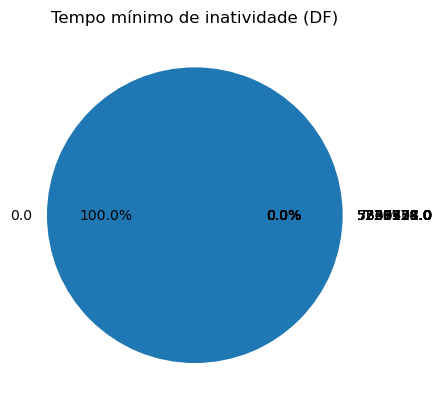

In [338]:
# DDoS flow
df_UDF = get_df_unique(ddosFlow, columns[84], ("tempo_minimo_inatividade","Count"), 1)
df_UDF

make_graph(2, df_UDF, "tempo_minimo_inatividade", "Count", (8,6), "Tempo mínimo de inatividade (DF)")

# analytic_data_std(ddosFlow, columns[84], ("tempo_minimo_inatividade","Count"), 30, 1, False, (75,8), "Tempo mínimo de inatividade (DFA)", 1)

In [339]:
# Gráfico da base completa
make_graph(3, df_final, columns[84], "Count", (20,6), "Tempo mínimo de inatividade", 0, 3000)

###### Desvio padrão

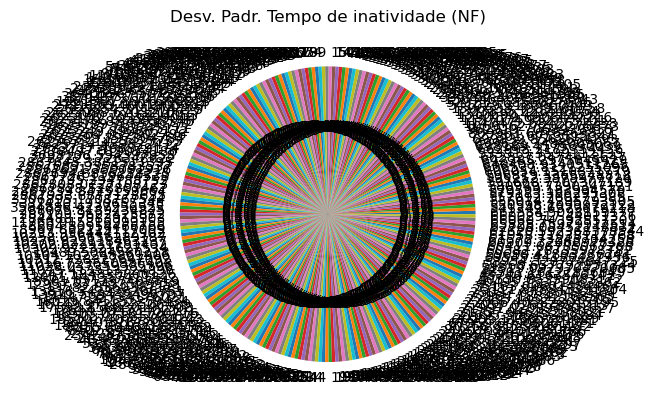

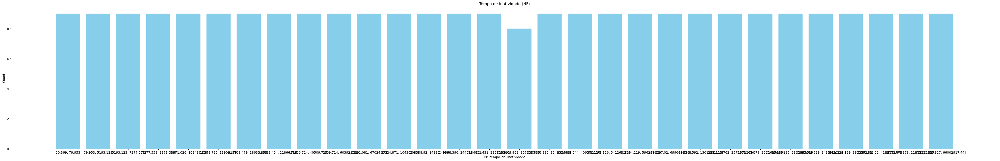

In [ ]:
# NormalFlow flow
df_UNF = get_df_unique(normalFlow, columns[82], ("DP_tempo_de_inatividade","Count"), 1)
df_UNF

make_graph(2, df_UNF.iloc[1:, :], "DP_tempo_de_inatividade", "Count", (8,6), "Desv. Padr. Tempo de inatividade (NF)")

analytic_data_std(normalFlow, columns[82], ("DP_tempo_de_inatividade","Count"), 30, 1, False, (55,8), "Tempo de inatividade (NF)", 1)

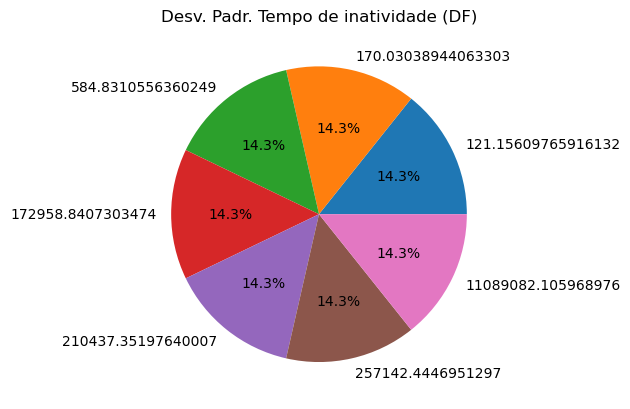

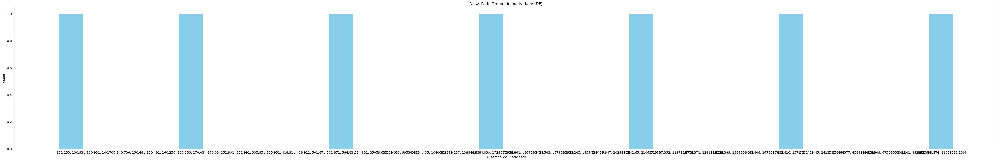

In [ ]:
# DDoS flow
df_UDF = get_df_unique(ddosFlow, columns[82], ("DP_tempo_de_inatividade","Count"), 1)
df_UDF

make_graph(2, df_UDF.iloc[1:, :], "DP_tempo_de_inatividade", "Count", (8,6), "Desv. Padr. Tempo de inatividade (DF)")

analytic_data_std(ddosFlow, columns[82], ("DP_tempo_de_inatividade","Count"), 30, 1, False, (55,8), "Desv. Padr. Tempo de inatividade (DF)", 1)

##### Similaridade com tráfego HTTP

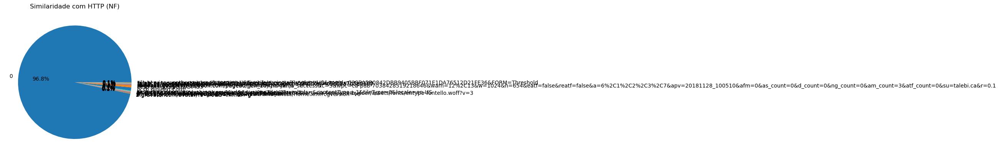

In [355]:
# NormalFlow

uniqueDf_t = [content for content in normalFlow[columns[85]]]

uniqueDf = np.unique(uniqueDf_t, return_counts=True)
df_unique = pd.DataFrame({columns[85]:uniqueDf[0], 'Count':uniqueDf[1]})
df_unique

make_graph(2, df_unique, "SimillarHTTP", "Count", (8,6), "Similaridade com HTTP (NF)")

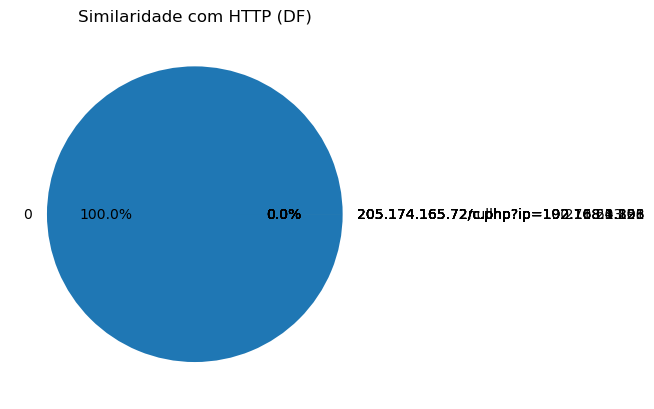

In [358]:
# DDoS Flow

uniqueDf_t = [content for content in ddosFlow[columns[85]]]

uniqueDf = np.unique(uniqueDf_t, return_counts=True)
df_unique = pd.DataFrame({columns[85]:uniqueDf[0], 'Count':uniqueDf[1]})
df_unique

make_graph(2, df_unique, "SimillarHTTP", "Count", (8,6), "Similaridade com HTTP (DF)")

In [ ]:
# Gráfico da base completa
# make_graph(3, df_final, columns[85], "Count", (20,6), "Similaridade com HTTP", 0, 3000)

TypeError: '<' not supported between instances of 'str' and 'int'

##### Indicador de tráfego de entrada

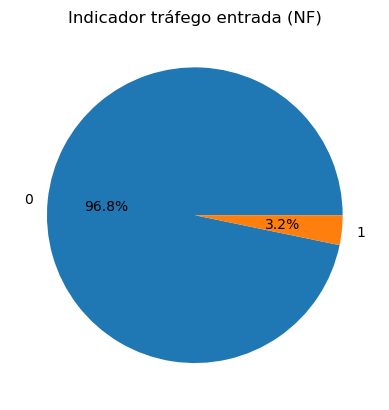

In [360]:
# NormalFlow flow
df_UNF = get_df_unique(normalFlow, columns[86], ("indicador_trafego_entrada","Count"), 1)
df_UNF

make_graph(2, df_UNF, "indicador_trafego_entrada", "Count", (8,6), "Indicador tráfego entrada (NF)")
# analytic_data_std(normalFlow, columns[86], ("indicador_trafego_entrada","Count"), 30, 1, False, (55,8), "Indicador tráfego de entrada (NF)", 0)

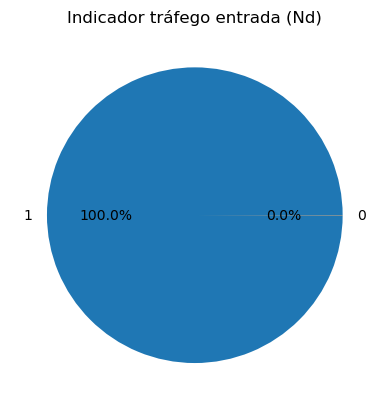

In [361]:
# DDoS flow
df_UDF = get_df_unique(ddosFlow, columns[86], ("indicador_trafego_entrada","Count"), 1)
df_UDF

make_graph(2, df_UDF, "indicador_trafego_entrada", "Count", (8,6), "Indicador tráfego entrada (Nd)")
# analytic_data_std(ddosFlow, columns[86], ("indicador_trafego_entrada","Count"), 30, 1, False, (55,8), "Indicador tráfego de entrada (DF)", 0)